# Dengue Case Prediction using Machine Learning

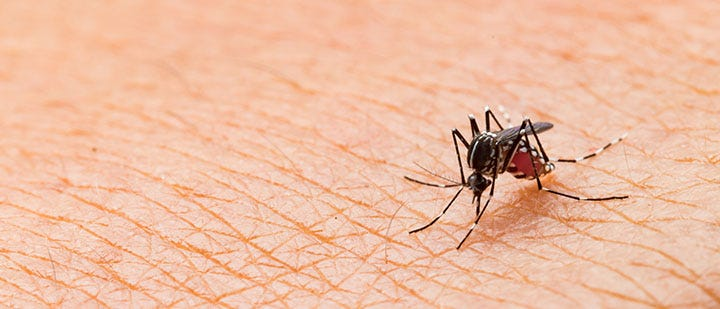

# Import Necessary Libraries

In [1]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
import warnings
warnings.filterwarnings('ignore')

# Import Dataset

In [3]:
df = pd.read_csv('dengue_data.csv')

# Exploratory Data Analysis

In [4]:
df.head()

,serial,tempmax,tempmin,temp,feelslikemax,feelslikemin,feelslike,dew,humidity,precip,...,sealevelpressure,cloudcover,visibility,solarradiation,solarenergy,uvindex,conditions,stations,cases,labels
0,0,34.053151,24.478082,28.709863,39.757808,25.317808,32.306301,22.971233,73.508219,2.921726,...,1007.911781,50.747945,3.789863,208.097808,17.973699,7.232877,2.558904,1.197260,4925,normal
1,1,34.086179,25.694309,29.464228,41.338211,28.140650,34.423577,23.484553,72.066667,3.783415,...,1003.533333,48.313821,2.884553,222.926016,19.246341,7.504065,1.658537,0.991870,5077,normal
2,2,34.573984,25.417886,29.526829,40.464228,26.560163,33.085366,22.580488,69.424390,3.065854,...,1005.731707,55.621138,4.242276,229.413008,19.802439,7.829268,1.910569,1.170732,7579,normal
3,3,33.020325,25.080488,28.727642,37.878049,26.193496,31.772358,21.752033,69.297561,6.025203,...,1003.359350,50.208130,2.991057,225.421951,19.480488,7.593496,1.300813,0.146341,13706,normal
4,4,30.660976,24.230894,26.774797,36.586992,24.263415,28.943902,24.214634,86.652033,23.336585,...,1009.995935,45.542276,3.886992,176.598374,15.261789,6.186992,0.967480,3.951220,82,normal


In [5]:
df.tail()

,serial,tempmax,tempmin,temp,feelslikemax,feelslikemin,feelslike,dew,humidity,precip,...,sealevelpressure,cloudcover,visibility,solarradiation,solarenergy,uvindex,conditions,stations,cases,labels
597,597,32.3,24.4,28.5,35.9,24.4,31.2,23.3,75.0,0.0,...,1008.9,50.4,3.1,252.5,21.9,9.0,1.0,1.0,6729,normal
598,598,32.7,26.4,29.3,36.3,26.4,32.5,22.6,68.5,0.0,...,1010.4,50.5,3.1,242.7,20.9,8.0,1.0,1.0,10541,normal
599,599,33.0,26.3,29.8,40.5,26.3,34.5,23.9,71.1,0.0,...,1010.8,30.5,3.1,195.3,16.9,8.0,1.0,1.0,6396,normal
600,600,35.1,26.8,30.6,42.9,29.1,35.1,23.3,65.9,0.0,...,1009.7,32.7,3.3,187.6,16.0,7.0,1.0,1.0,10883,normal
601,601,34.0,26.3,30.2,38.1,26.3,33.1,21.5,60.4,0.0,...,1008.7,46.5,3.9,136.2,11.7,5.0,1.0,1.0,7311,normal


In [6]:
df.shape

(602, 26)

In [7]:
df.columns

Index(['serial', 'tempmax', 'tempmin', 'temp', 'feelslikemax', 'feelslikemin',
       'feelslike', 'dew', 'humidity', 'precip', 'precipprob', 'precipcover',
       'snow', 'snowdepth', 'windspeed', 'winddir', 'sealevelpressure',
       'cloudcover', 'visibility', 'solarradiation', 'solarenergy', 'uvindex',
       'conditions', 'stations', 'cases', 'labels'],
      dtype='object')

In [8]:
df = df.drop('serial', axis = 1)

In [9]:
df.duplicated().sum()

0

In [10]:
df.isnull().sum()

tempmax             0
tempmin             0
temp                0
feelslikemax        0
feelslikemin        0
feelslike           0
dew                 0
humidity            0
precip              0
precipprob          0
precipcover         0
snow                0
snowdepth           0
windspeed           0
winddir             0
sealevelpressure    0
cloudcover          0
visibility          0
solarradiation      0
solarenergy         0
uvindex             0
conditions          0
stations            0
cases               0
labels              0
dtype: int64

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 602 entries, 0 to 601
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   tempmax           602 non-null    float64
 1   tempmin           602 non-null    float64
 2   temp              602 non-null    float64
 3   feelslikemax      602 non-null    float64
 4   feelslikemin      602 non-null    float64
 5   feelslike         602 non-null    float64
 6   dew               602 non-null    float64
 7   humidity          602 non-null    float64
 8   precip            602 non-null    float64
 9   precipprob        602 non-null    float64
 10  precipcover       602 non-null    float64
 11  snow              602 non-null    int64  
 12  snowdepth         602 non-null    int64  
 13  windspeed         602 non-null    float64
 14  winddir           602 non-null    float64
 15  sealevelpressure  602 non-null    float64
 16  cloudcover        602 non-null    float64
 1

In [12]:
df.describe()

,tempmax,tempmin,temp,feelslikemax,feelslikemin,feelslike,dew,humidity,precip,precipprob,...,winddir,sealevelpressure,cloudcover,visibility,solarradiation,solarenergy,uvindex,conditions,stations,cases
count,602.000000,602.000000,602.000000,602.000000,602.000000,602.000000,602.000000,602.000000,602.000000,602.000000,...,602.000000,602.000000,602.000000,602.000000,602.000000,602.000000,602.000000,602.000000,602.000000,602.000000
mean,31.918079,24.588318,27.813181,38.476069,25.613154,31.485111,23.984349,81.254786,13.120862,69.625588,...,191.498693,1004.690531,59.701192,3.632620,199.802695,17.251785,6.877674,1.827725,0.859734,8502.342193
std,2.737215,2.727919,2.412416,4.776400,4.178797,4.672951,2.668014,9.406354,28.463365,45.539264,...,81.604668,41.364967,20.832639,1.890352,54.128192,4.676051,1.763928,1.237389,0.973575,6780.749627
min,25.000000,12.740000,18.820000,25.000000,12.360000,18.626667,4.480000,40.833333,0.000000,0.000000,...,0.500000,0.000000,0.000000,0.800000,57.900000,5.000000,2.000000,0.000000,0.000000,52.000000
25%,30.025000,23.200000,26.500000,35.600000,23.200000,28.100000,23.300000,75.800000,0.000000,0.000000,...,134.425000,1002.025000,47.400000,2.523780,160.350000,13.900000,6.000000,1.000000,0.000000,3017.750000
50%,31.700000,25.000000,27.900000,38.400000,25.000000,31.500000,24.529268,82.800000,3.000000,100.000000,...,207.300000,1007.000000,63.700000,3.200000,205.750000,17.750000,7.000000,2.000000,1.000000,7490.000000
75%,33.600000,26.500000,29.448171,41.900000,26.600000,34.875000,25.475000,88.175000,12.589000,100.000000,...,252.375000,1010.185772,73.200000,4.300000,238.800610,20.600610,8.000000,3.000000,1.000000,12702.500000
max,41.200000,29.400000,33.300000,49.600000,37.900000,42.900000,28.100000,99.300000,302.000000,100.000000,...,359.200000,1020.000000,97.900000,24.033333,318.500000,27.700000,10.000000,4.000000,5.000000,24983.000000


In [13]:
df.nunique()

tempmax             118
tempmin             126
temp                125
feelslikemax        192
feelslikemin        157
feelslike           202
dew                 123
humidity            295
precip              207
precipprob           17
precipcover          35
snow                  1
snowdepth             1
windspeed           165
winddir             539
sealevelpressure    221
cloudcover          408
visibility           77
solarradiation      523
solarenergy         196
uvindex              24
conditions           20
stations             17
cases               578
labels                1
dtype: int64

In [14]:
object_columns = df.select_dtypes(include=['object']).columns
print("Object type columns:")
print(object_columns)

numerical_columns = df.select_dtypes(include=['int64', 'float64']).columns
print("\nNumerical type columns:")
print(numerical_columns)

Object type columns:
Index(['labels'], dtype='object')

Numerical type columns:
Index(['tempmax', 'tempmin', 'temp', 'feelslikemax', 'feelslikemin',
       'feelslike', 'dew', 'humidity', 'precip', 'precipprob', 'precipcover',
       'snow', 'snowdepth', 'windspeed', 'winddir', 'sealevelpressure',
       'cloudcover', 'visibility', 'solarradiation', 'solarenergy', 'uvindex',
       'conditions', 'stations', 'cases'],
      dtype='object')


In [15]:
def classify_features(df):
    categorical_features = []
    non_categorical_features = []
    discrete_features = []
    continuous_features = []

    for column in df.columns:
        if df[column].dtype == 'object':
            if df[column].nunique() < 20:
                categorical_features.append(column)
            else:
                non_categorical_features.append(column)
        elif df[column].dtype in ['int64', 'float64']:
            if df[column].nunique() < 10:
                discrete_features.append(column)
            else:
                continuous_features.append(column)

    return categorical_features, non_categorical_features, discrete_features, continuous_features

In [16]:
categorical, non_categorical, discrete, continuous = classify_features(df)

In [17]:
print("Categorical Features:", categorical)
print("Non-Categorical Features:", non_categorical)
print("Discrete Features:", discrete)
print("Continuous Features:", continuous)

Categorical Features: ['labels']
Non-Categorical Features: []
Discrete Features: ['snow', 'snowdepth']
Continuous Features: ['tempmax', 'tempmin', 'temp', 'feelslikemax', 'feelslikemin', 'feelslike', 'dew', 'humidity', 'precip', 'precipprob', 'precipcover', 'windspeed', 'winddir', 'sealevelpressure', 'cloudcover', 'visibility', 'solarradiation', 'solarenergy', 'uvindex', 'conditions', 'stations', 'cases']


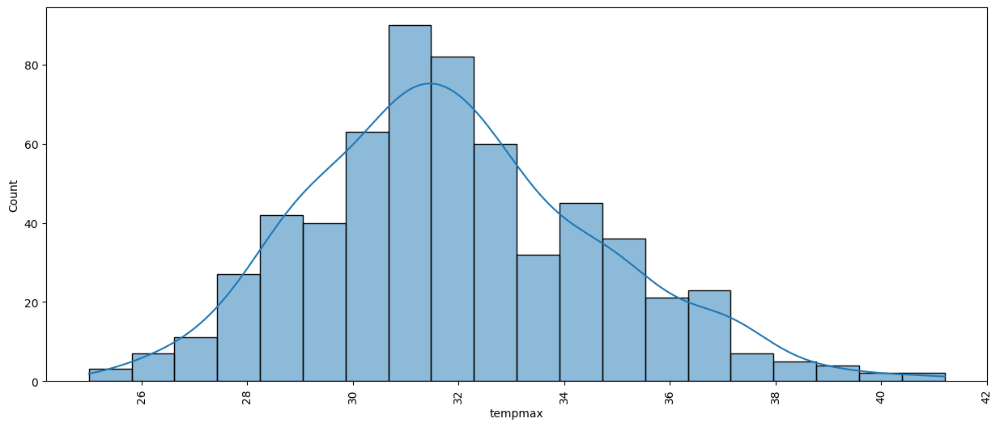

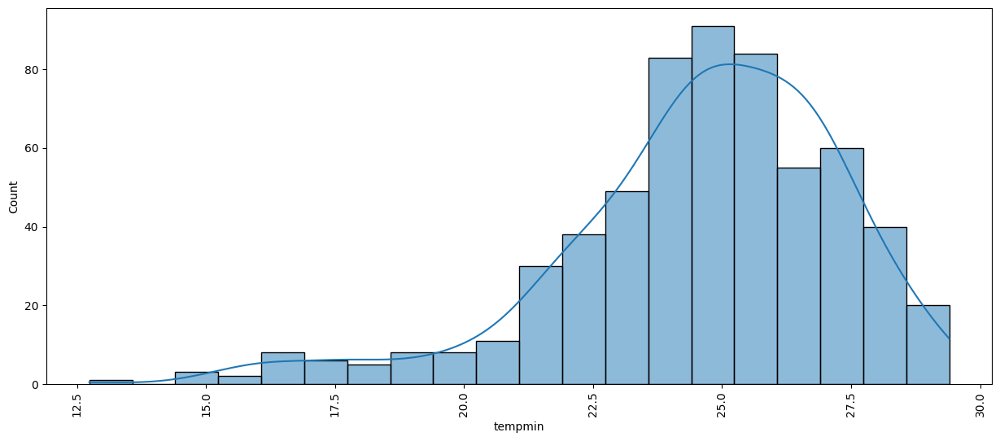

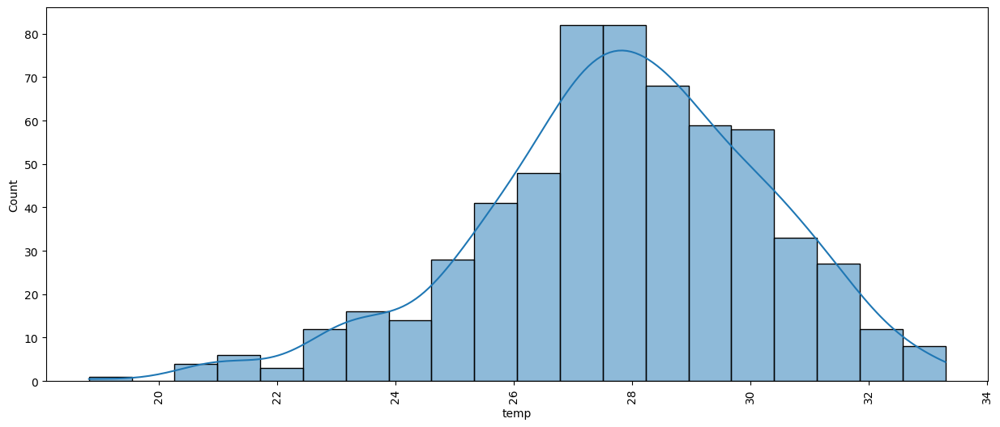

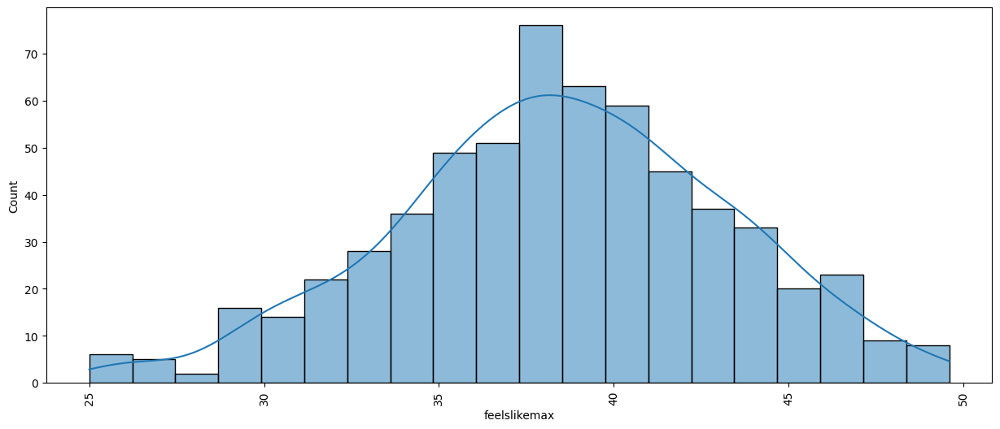

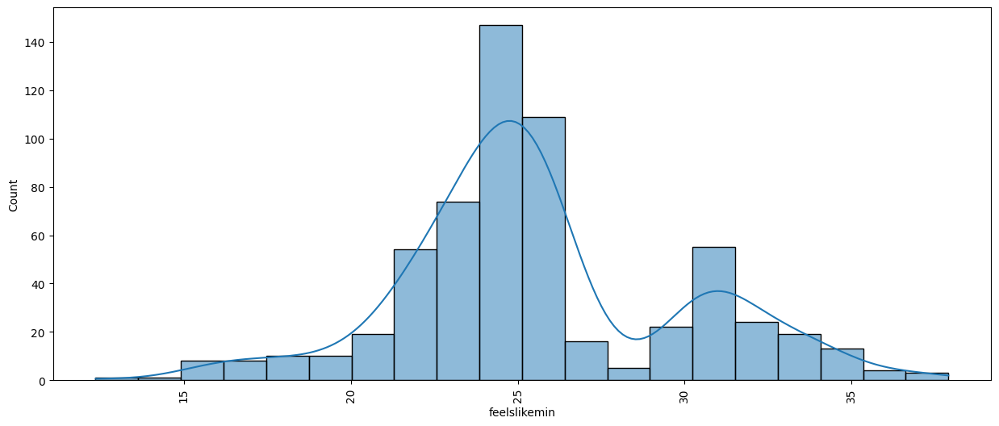

...

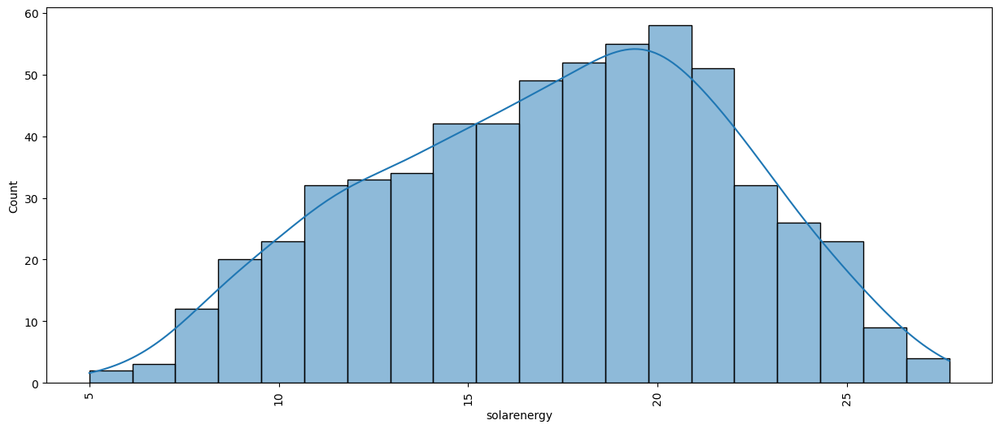

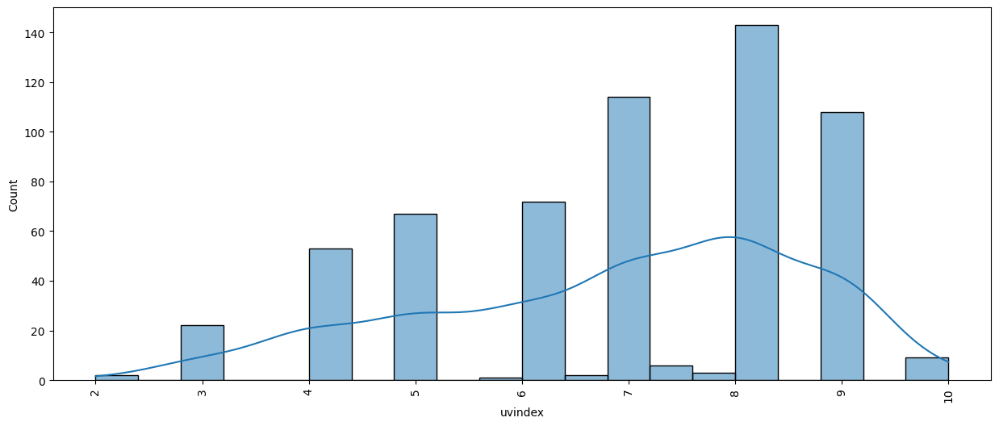

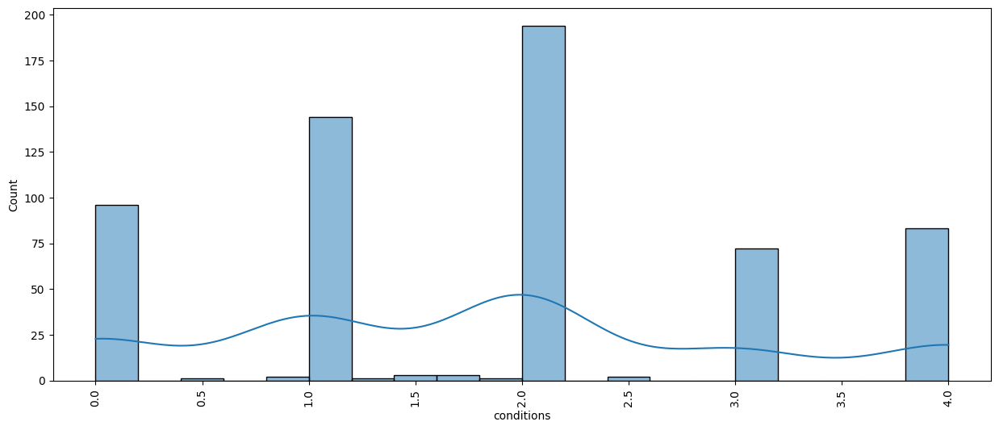

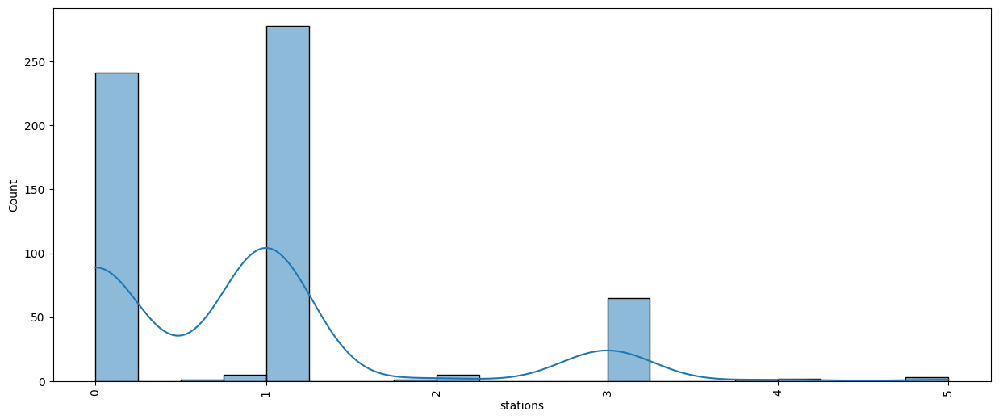

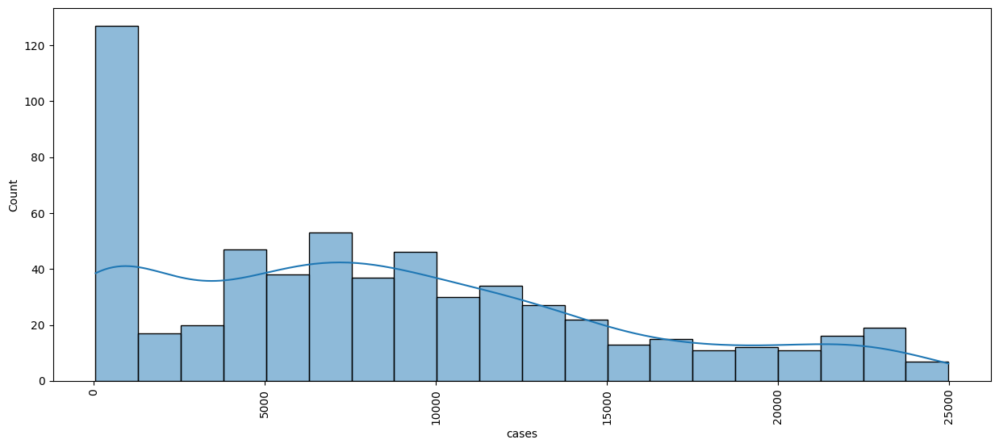

In [18]:
for i in continuous:
    plt.figure(figsize=(15,6))
    sns.histplot(df[i], bins = 20, kde = True, palette='hls')
    plt.xticks(rotation = 90)
    plt.show()

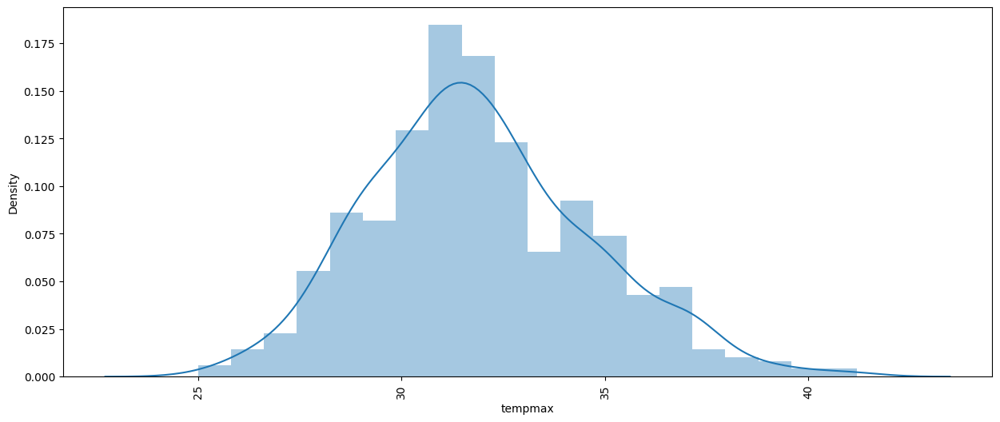

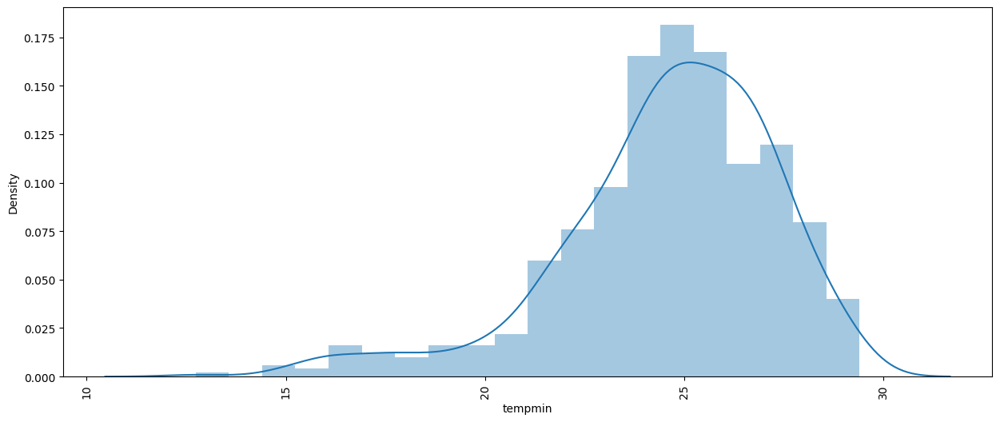

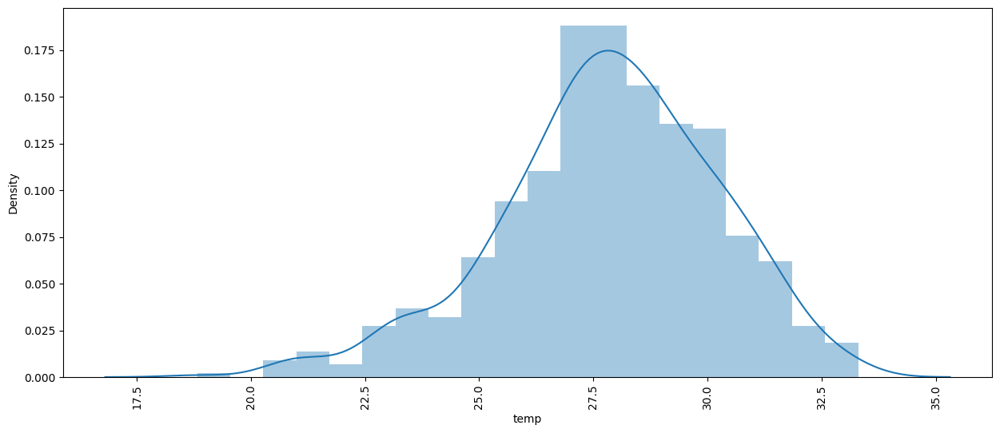

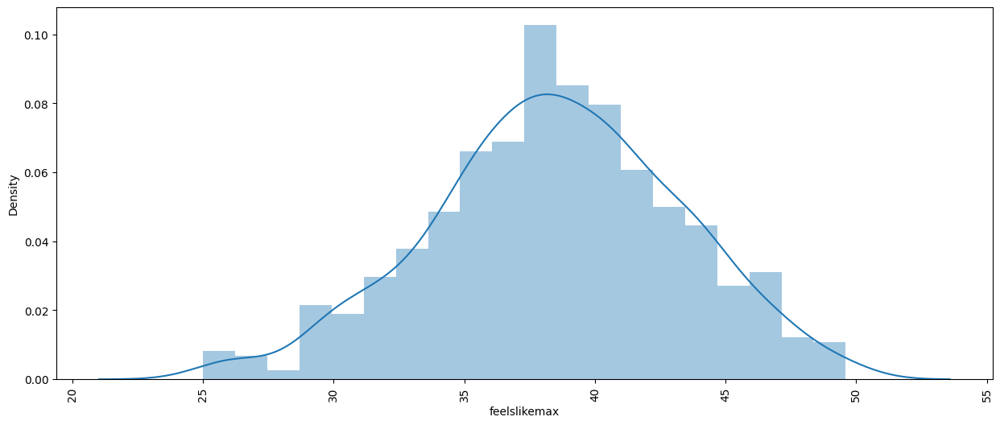

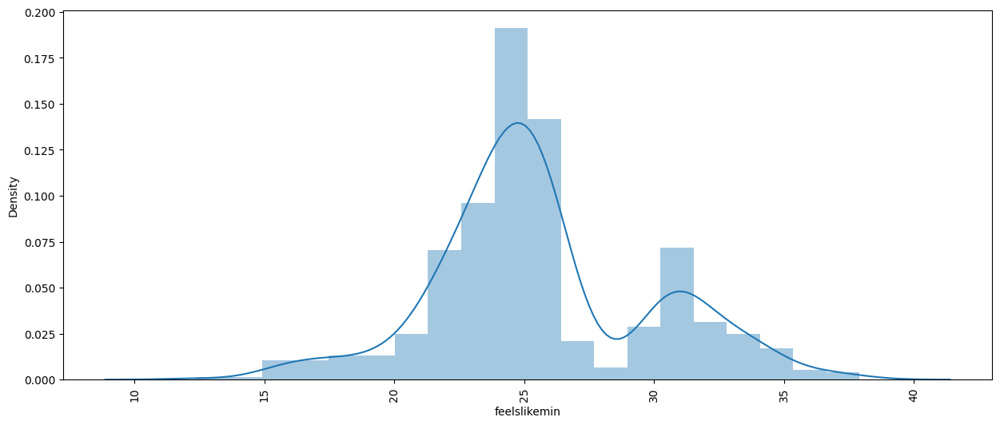

...

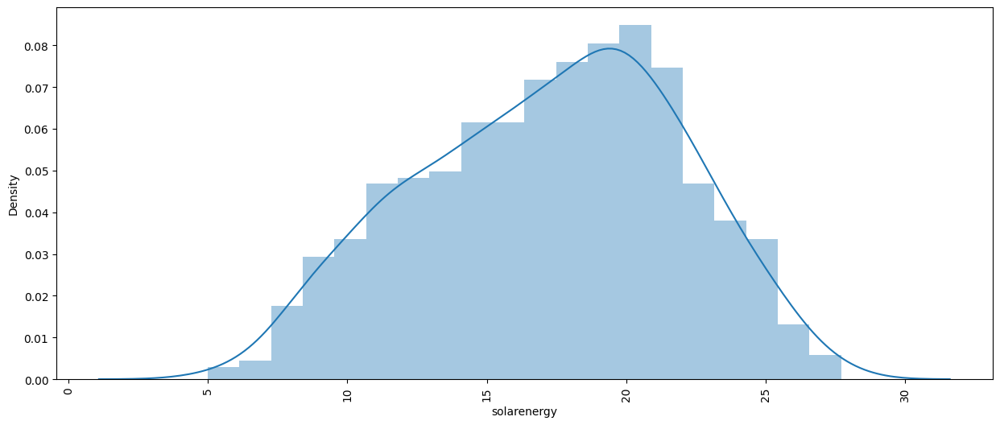

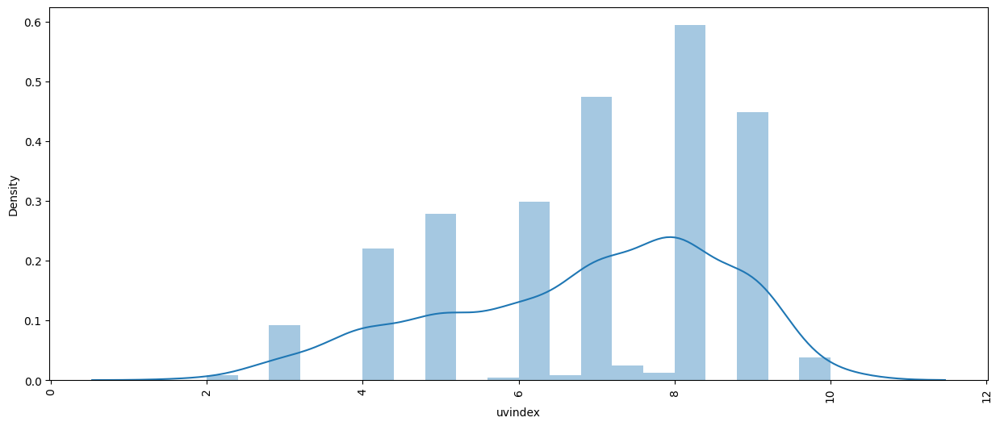

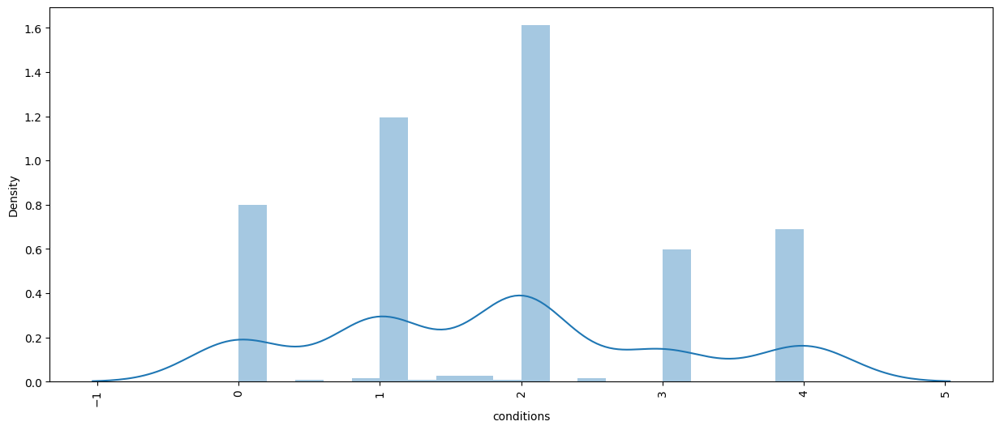

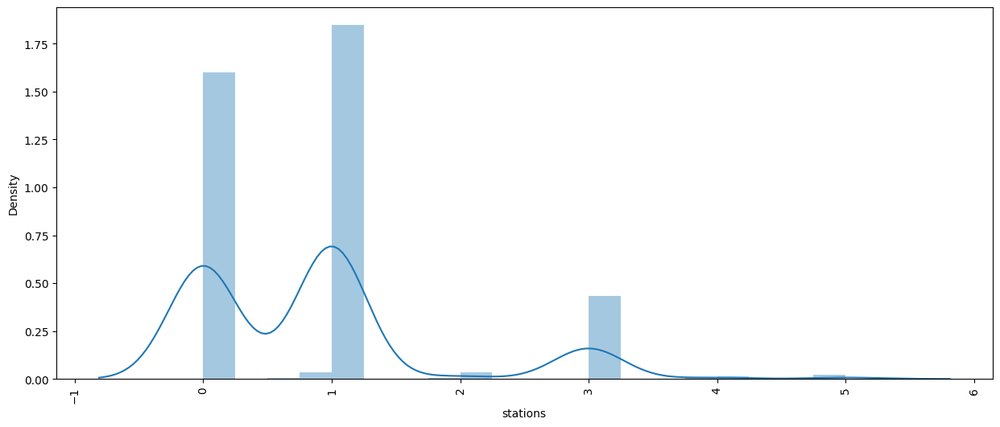

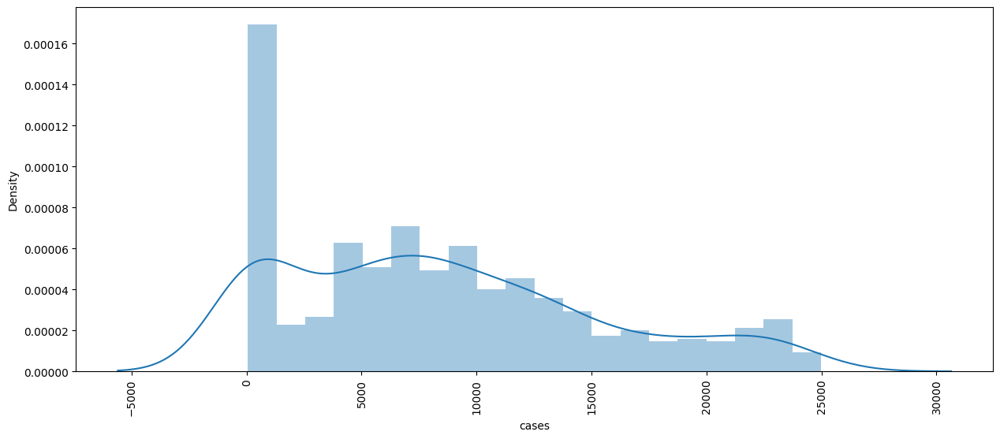

In [19]:
for i in continuous:
    plt.figure(figsize=(15,6))
    sns.distplot(df[i], bins = 20, kde = True)
    plt.xticks(rotation = 90)
    plt.show()

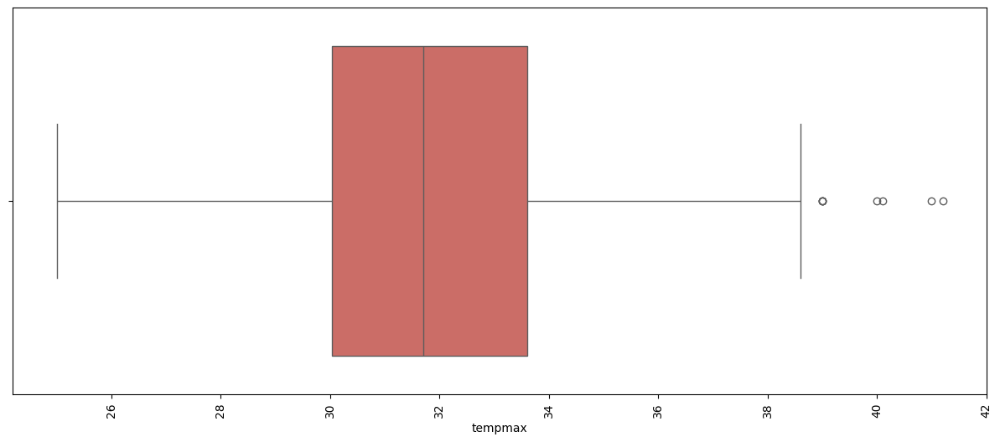

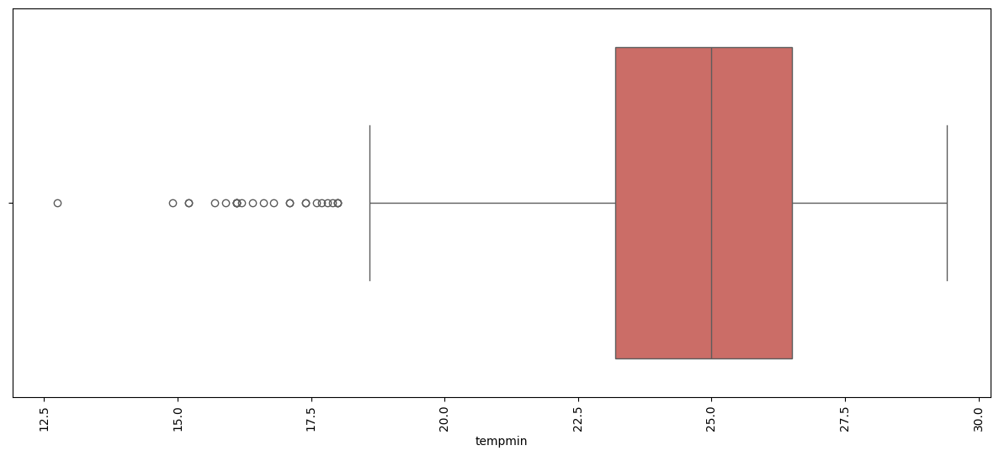

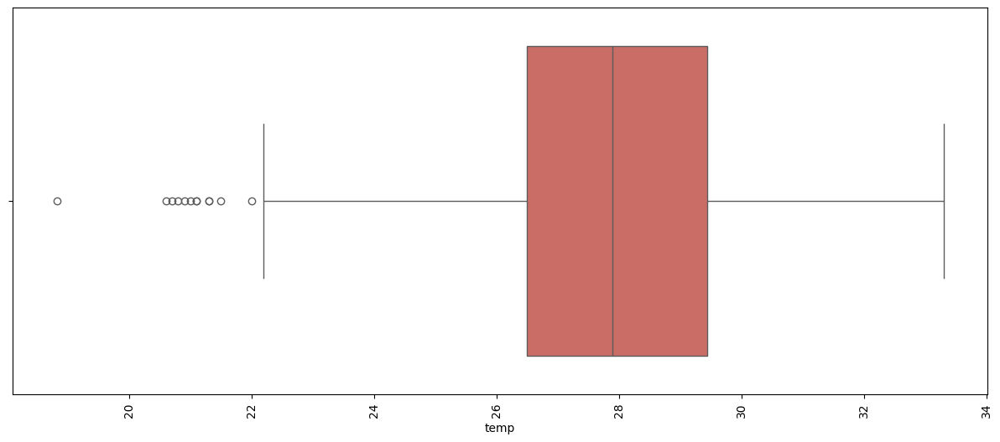

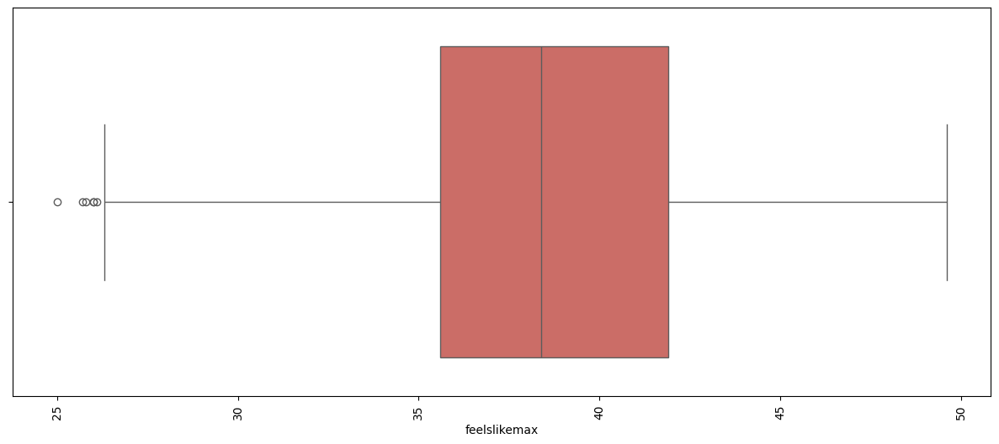

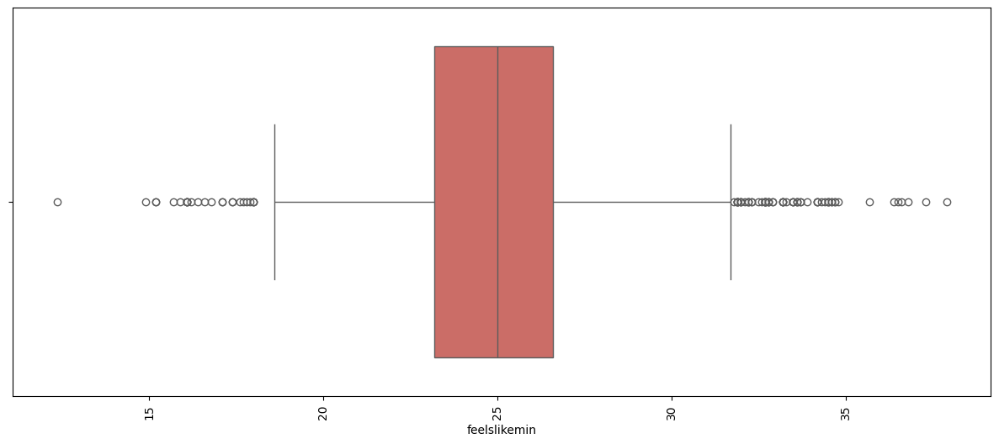

...

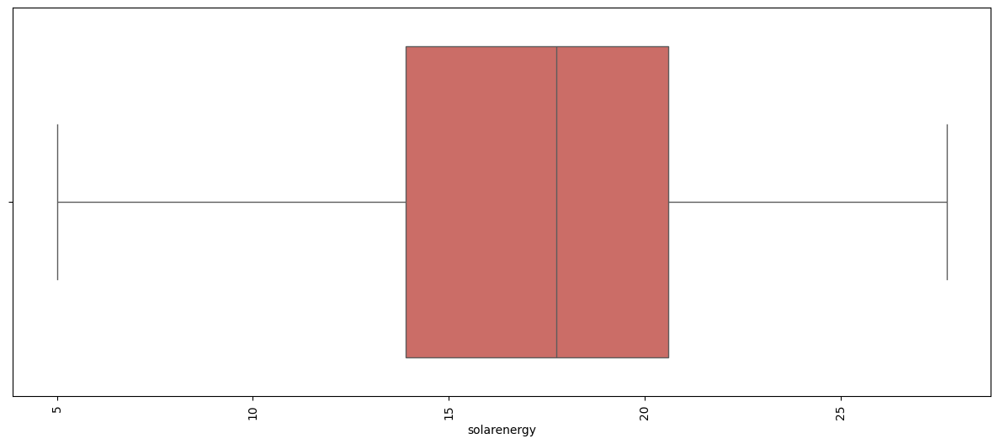

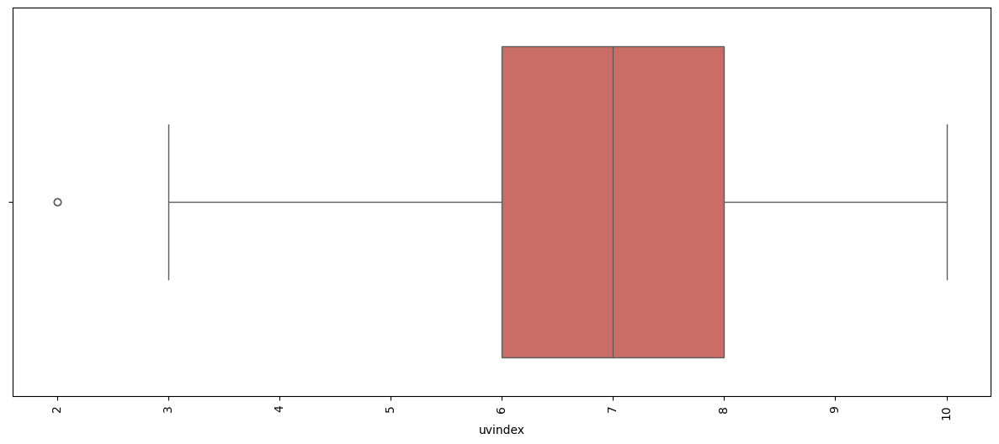

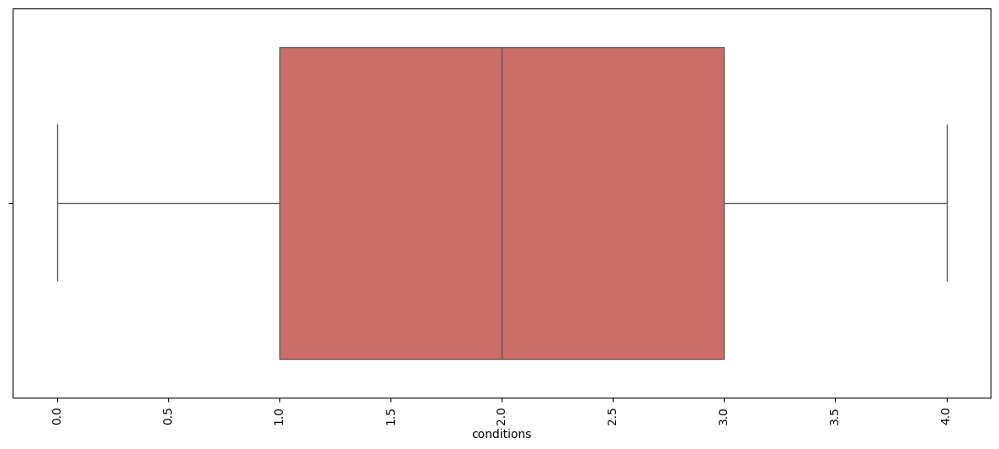

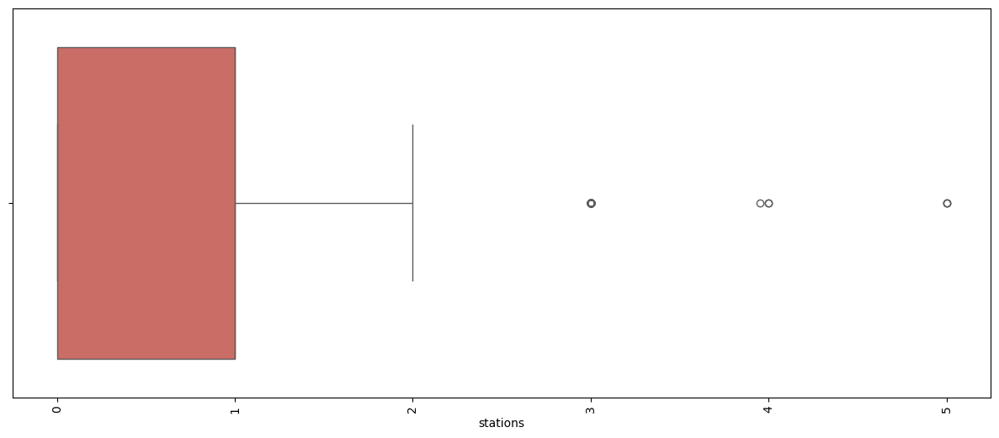

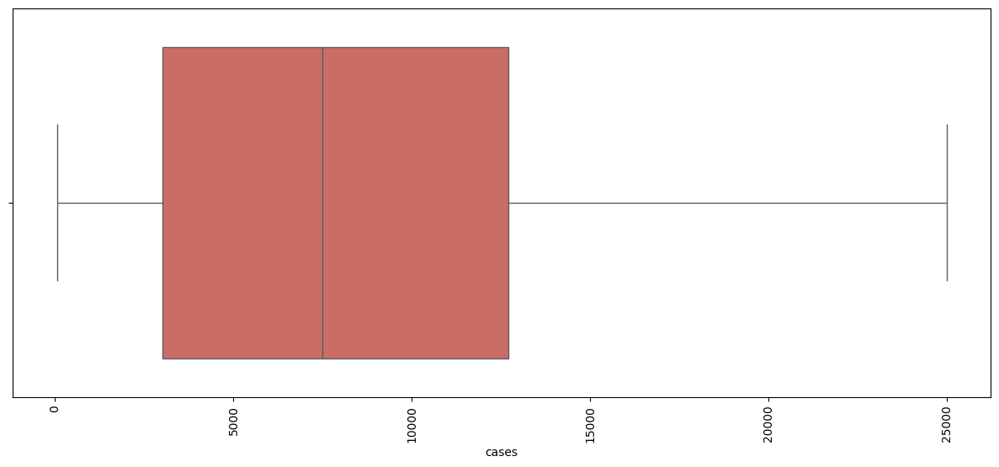

In [20]:
for i in continuous:
    plt.figure(figsize=(15, 6))
    sns.boxplot(x=i, data=df, palette='hls')
    plt.xticks(rotation=90)
    plt.show()

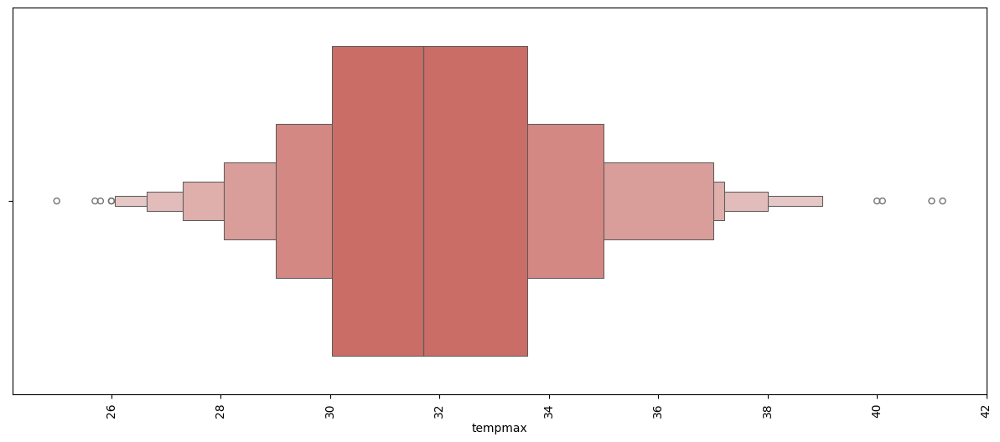

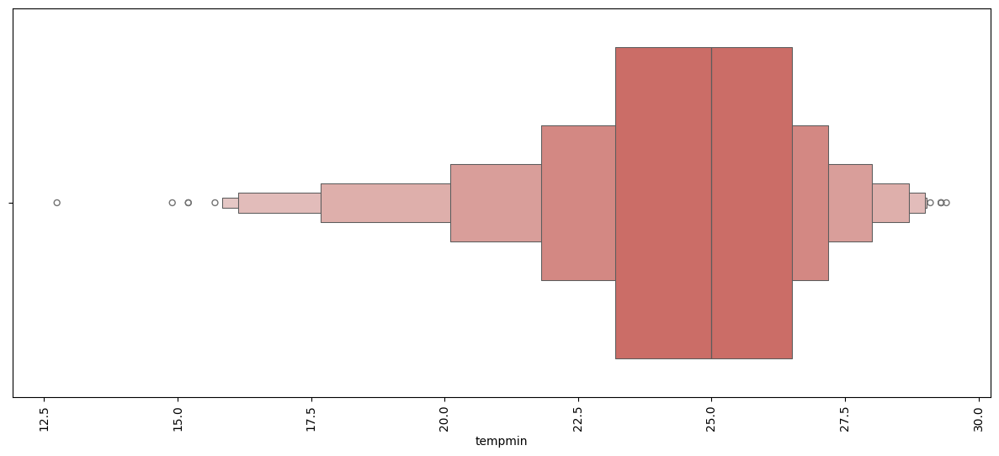

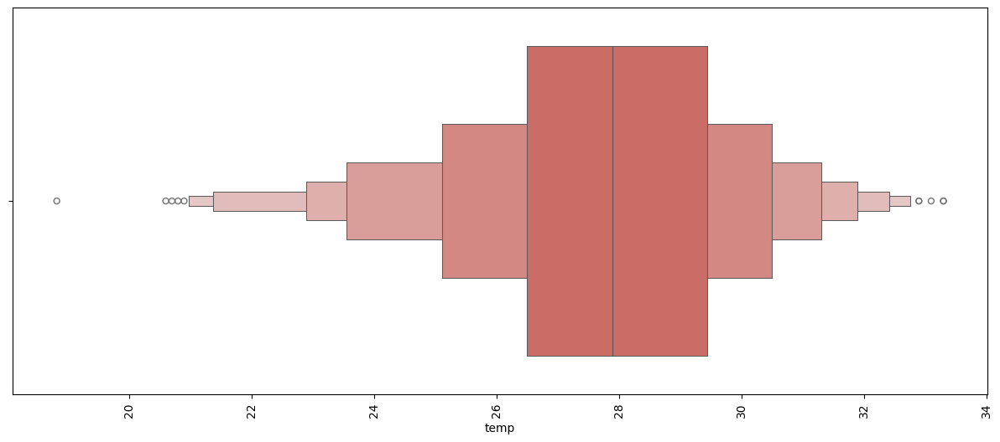

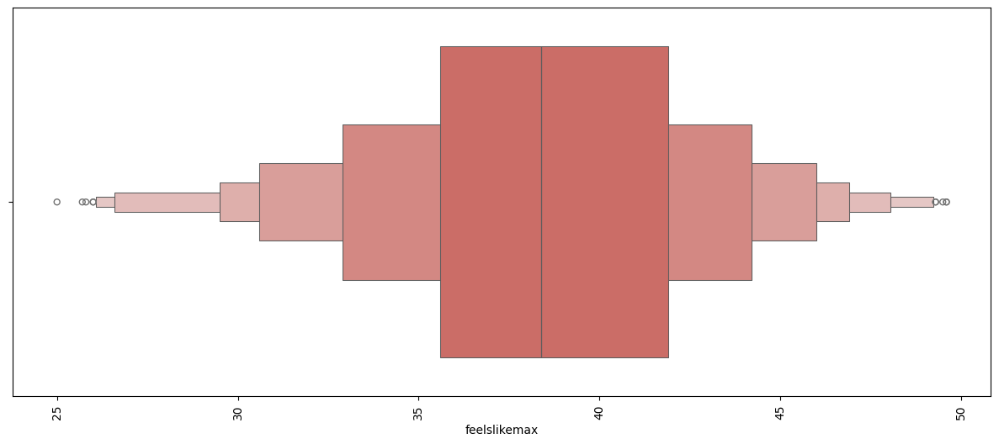

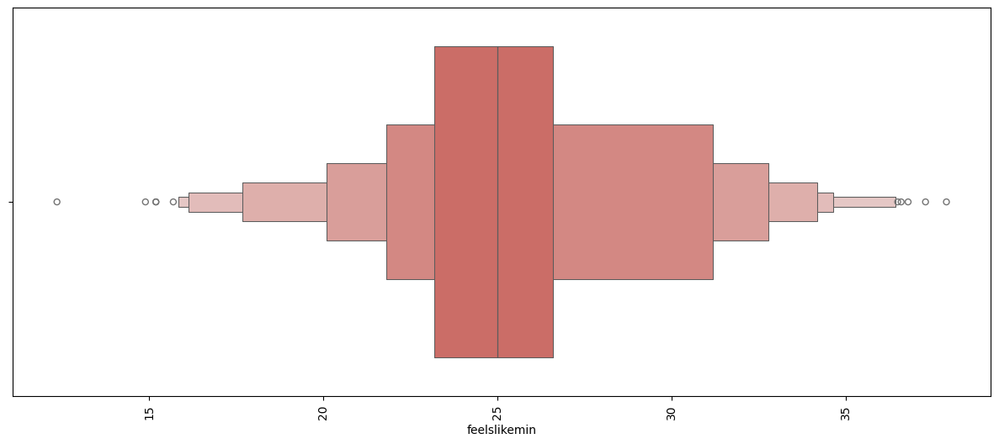

...

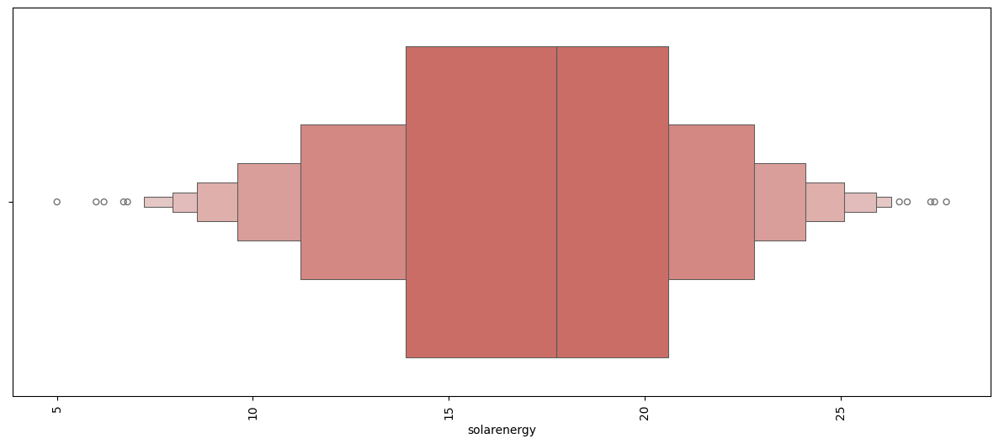

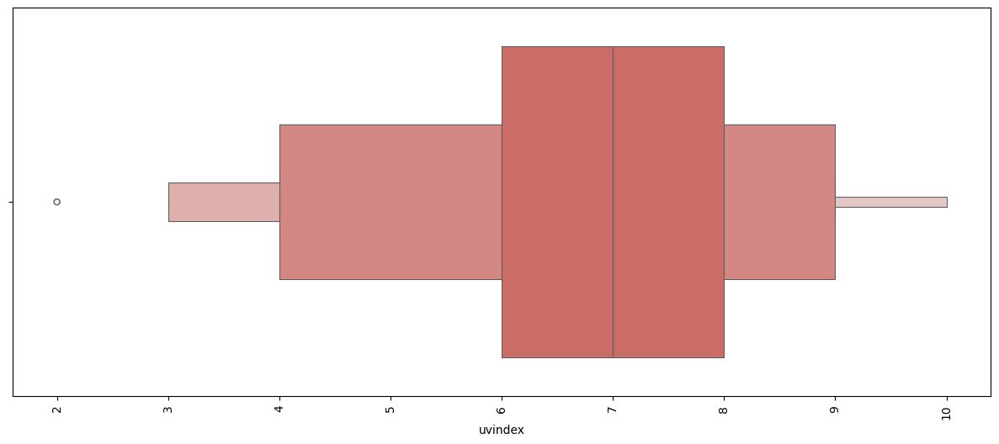

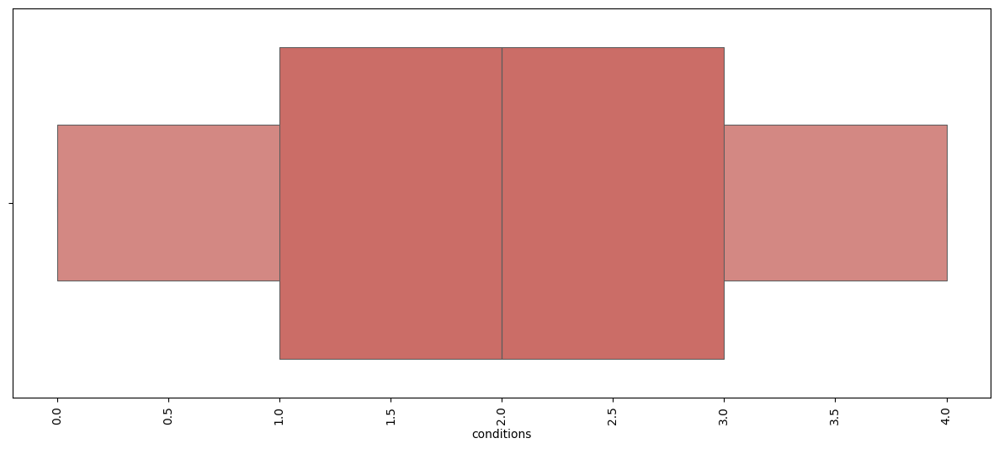

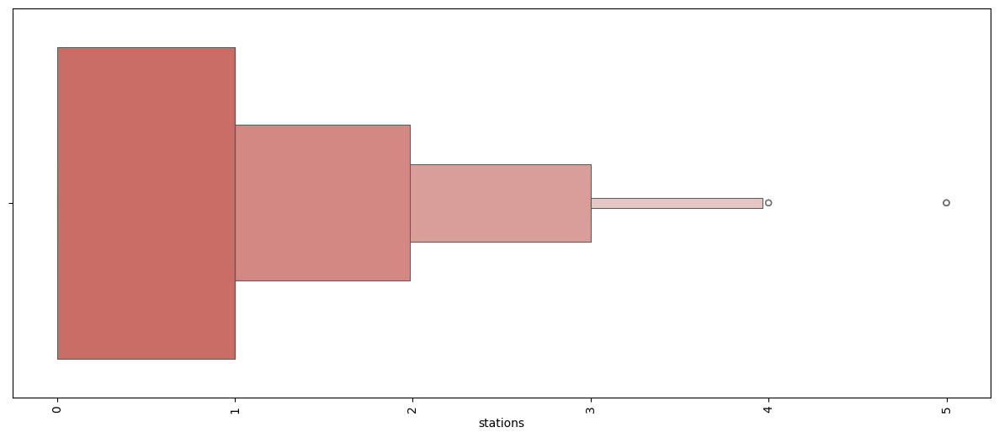

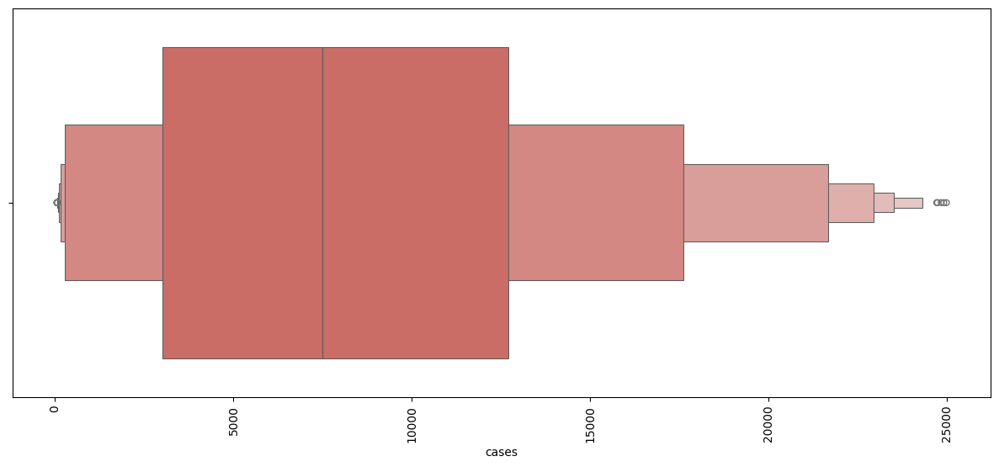

In [21]:
for i in continuous:
    plt.figure(figsize=(15, 6))
    sns.boxenplot(x=i, data=df, palette='hls')
    plt.xticks(rotation=90)
    plt.show()

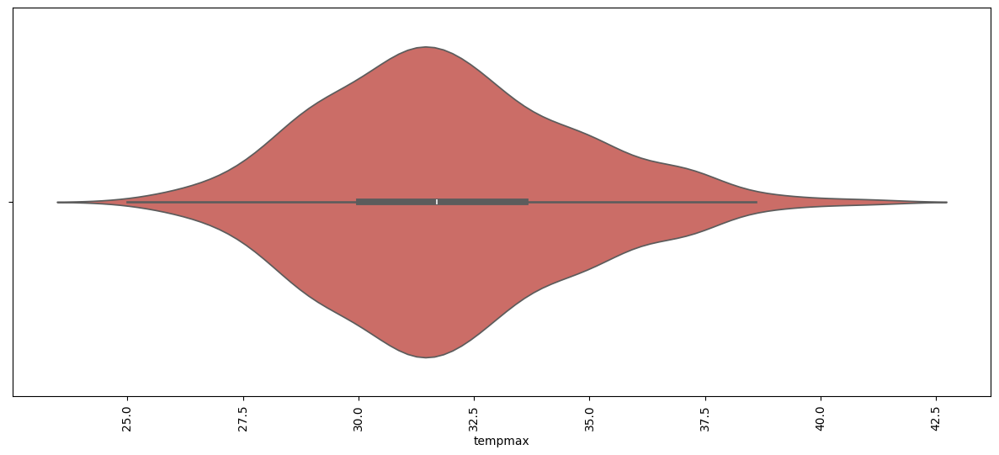

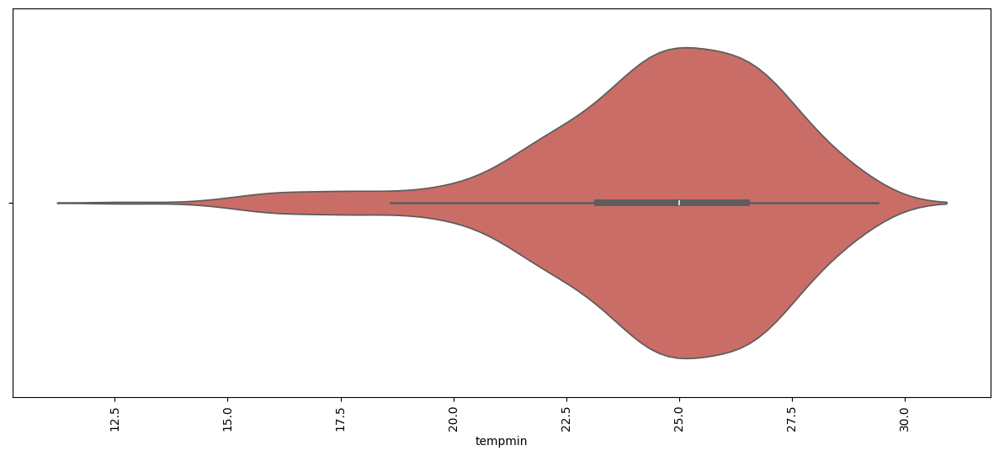

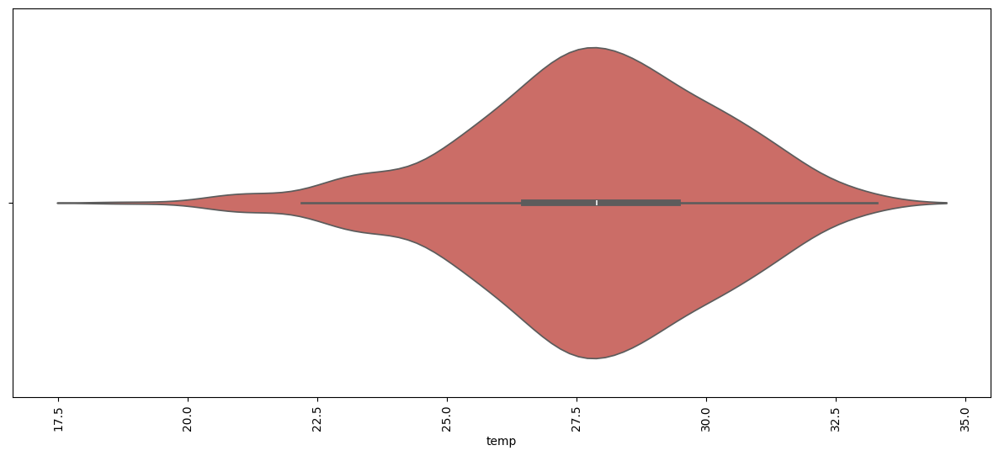

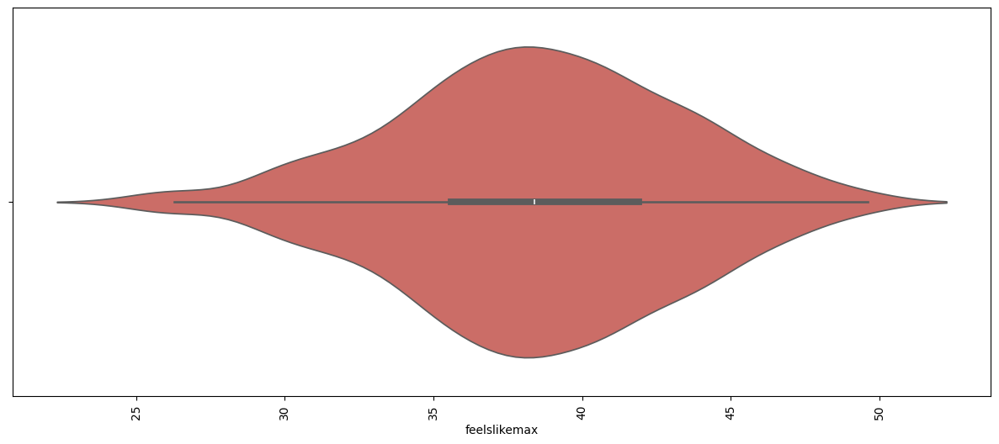

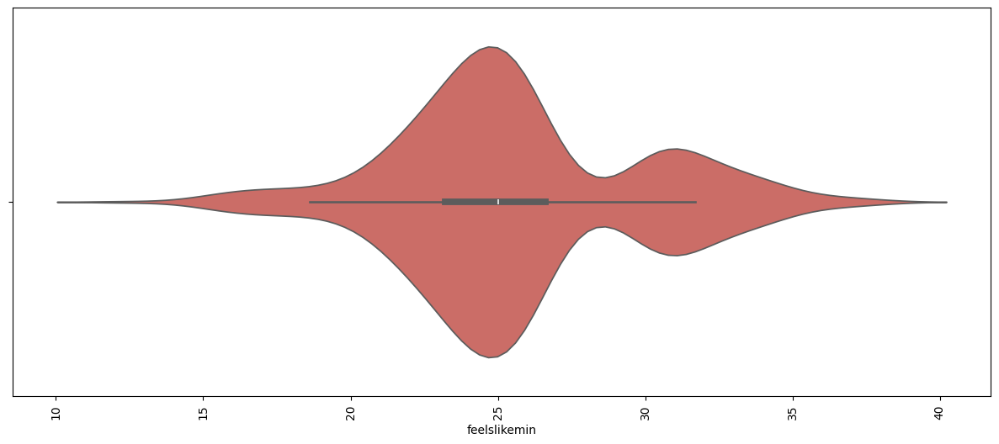

...

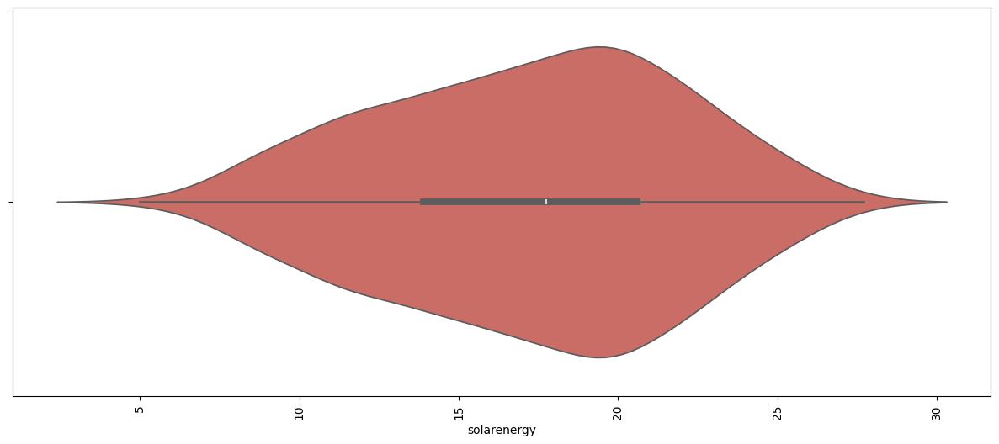

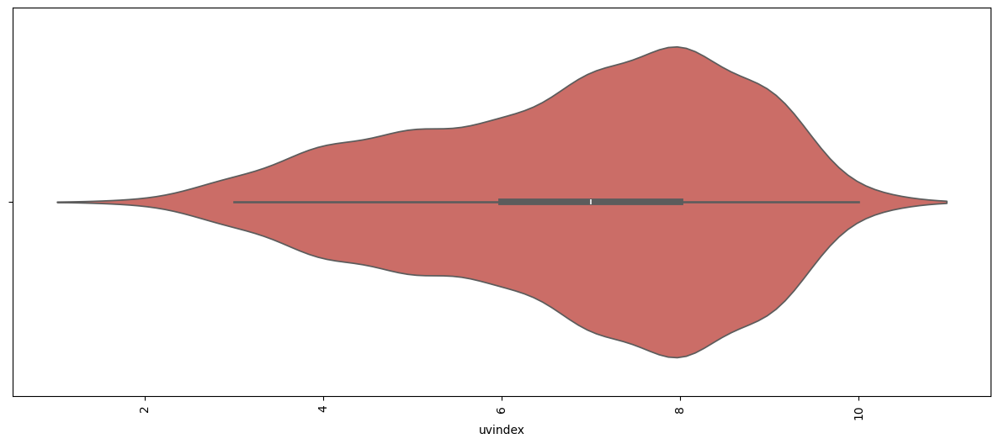

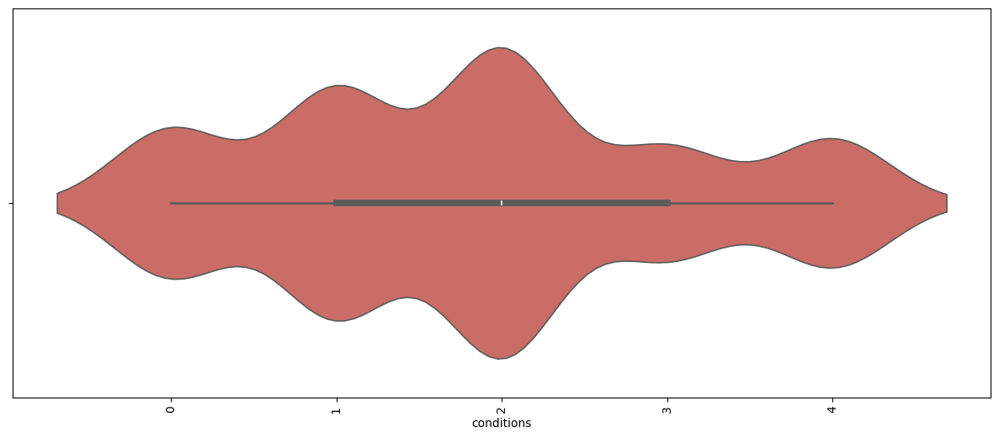

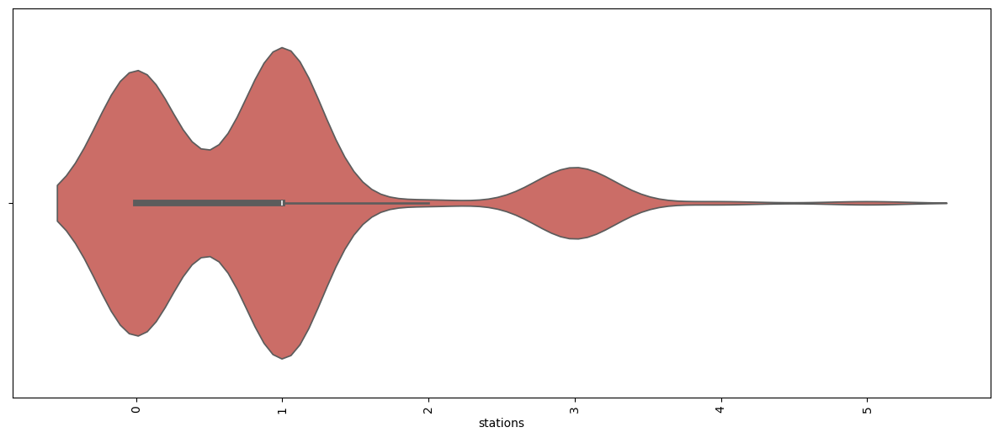

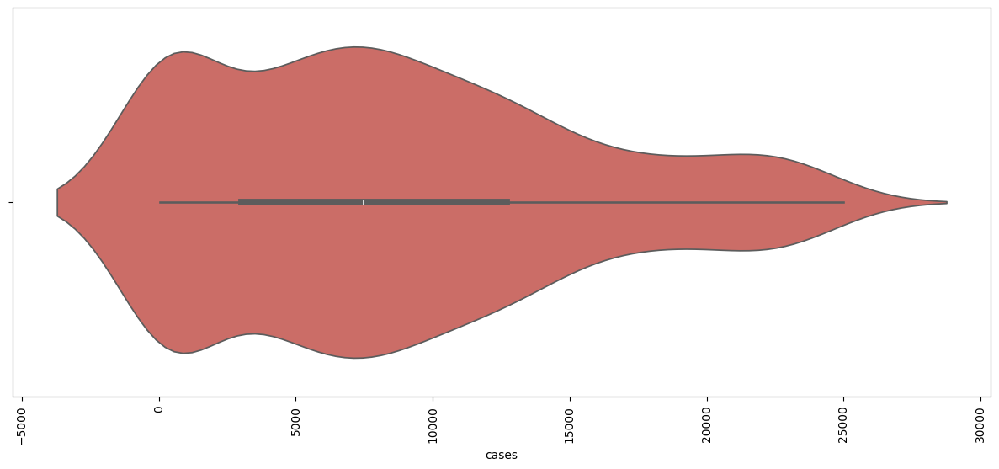

In [22]:
for i in continuous:
    plt.figure(figsize=(15, 6))
    sns.violinplot(x=i, data=df, palette='hls')
    plt.xticks(rotation=90)
    plt.show()

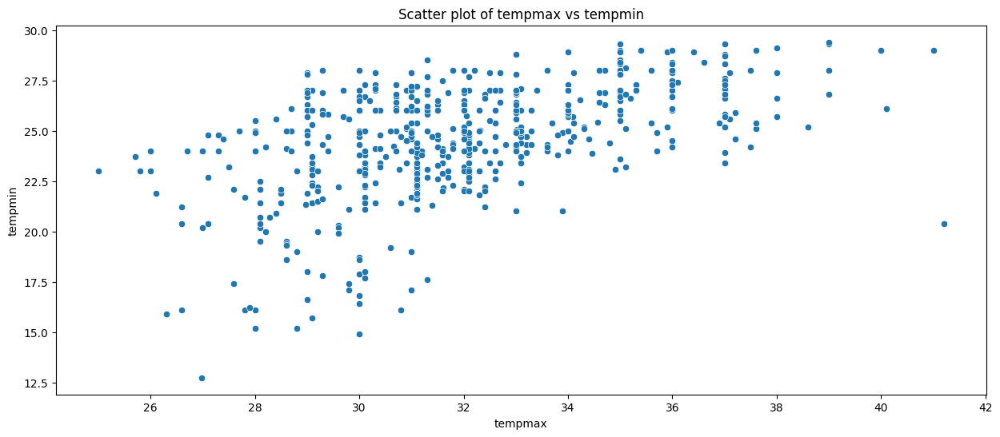

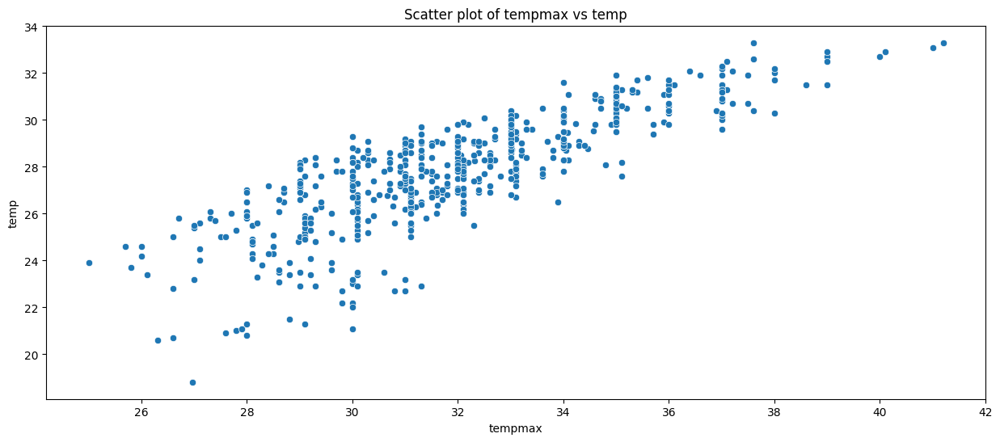

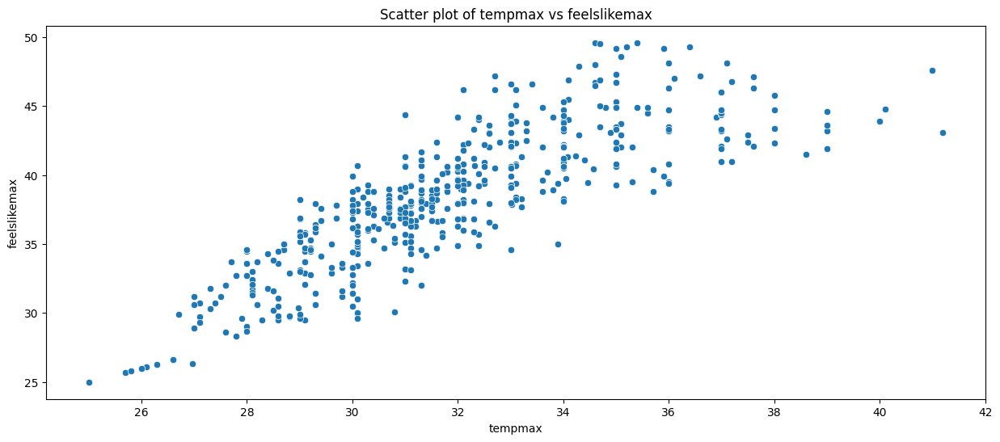

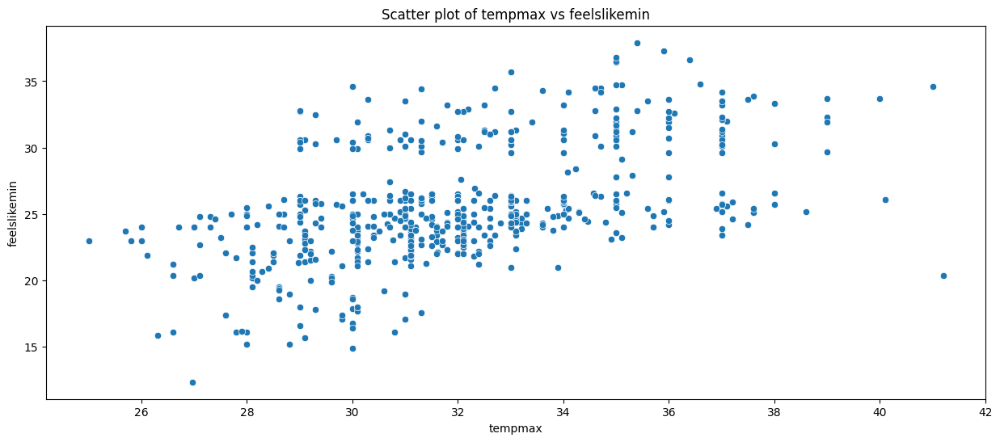

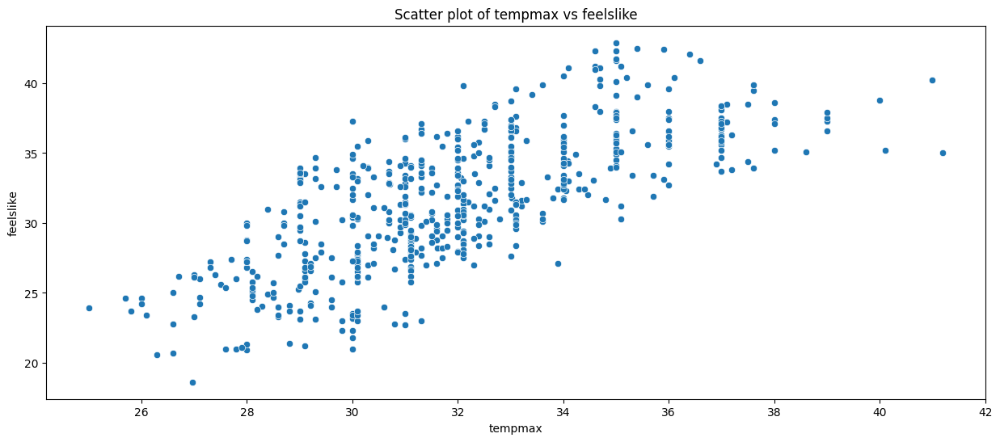

...

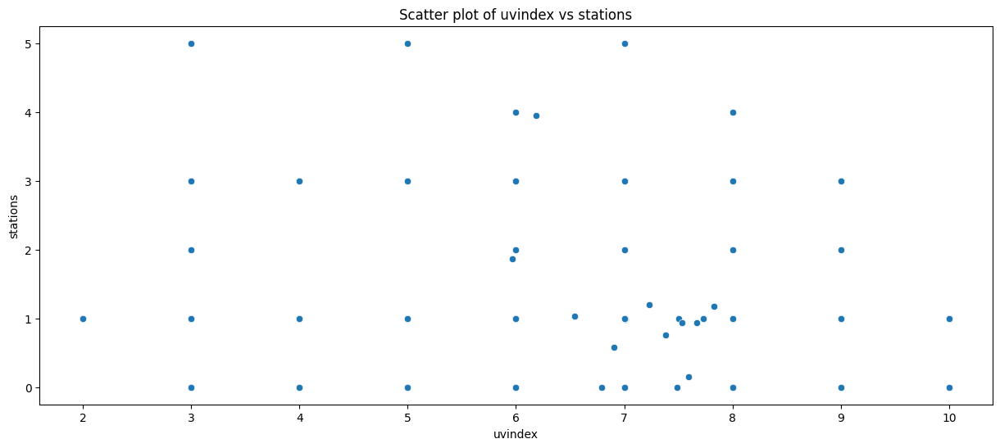

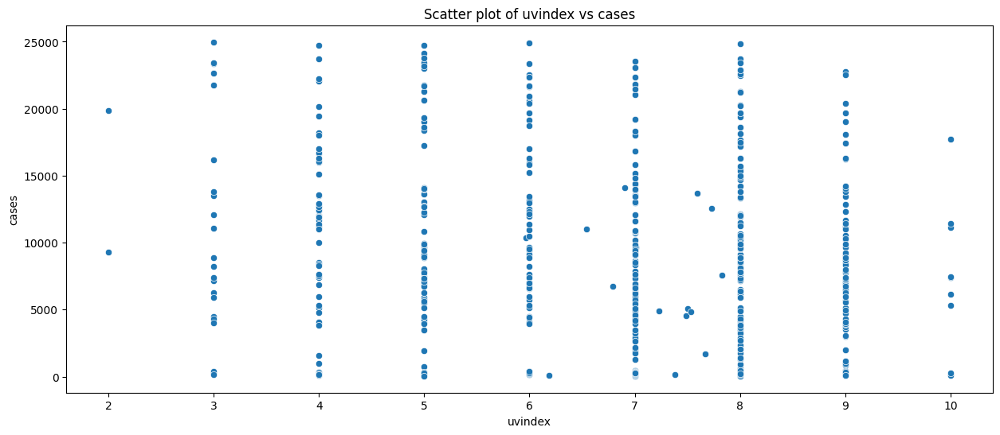

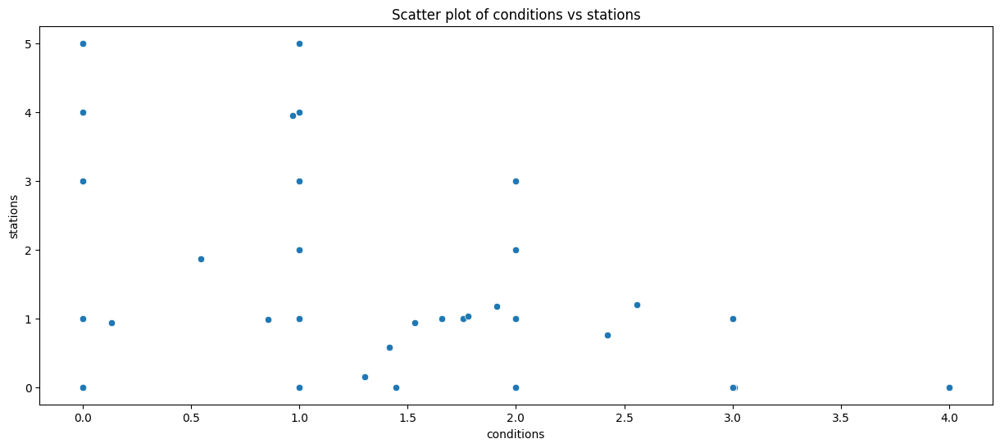

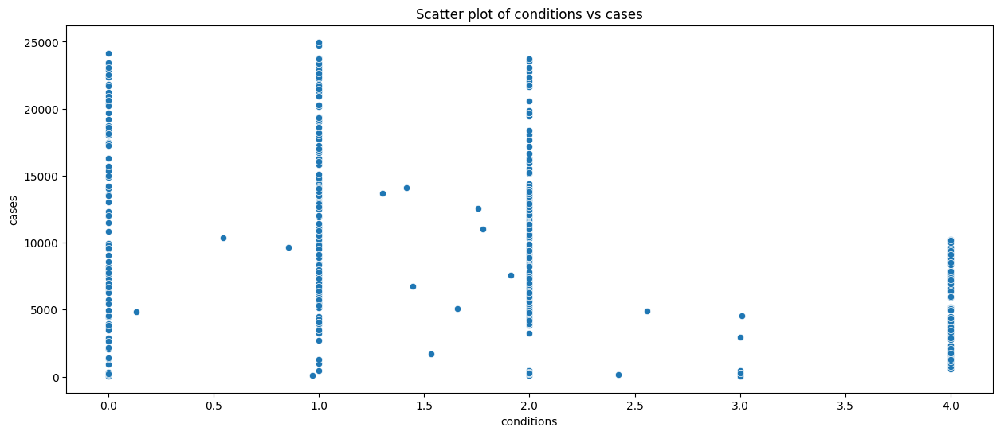

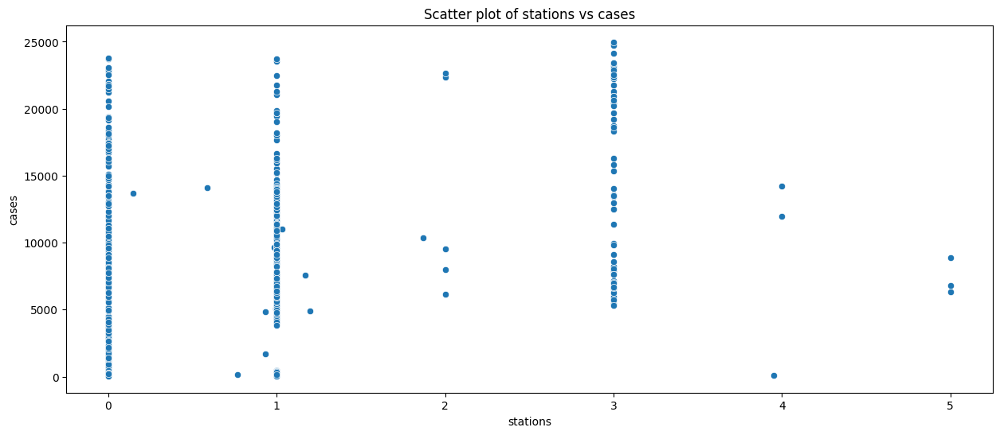

In [23]:
for i in range(len(continuous)):
    for j in range(i + 1, len(continuous)):
        plt.figure(figsize=(15, 6))
        sns.scatterplot(x=continuous[i], y=continuous[j], data=df, palette='hls')
        plt.title(f'Scatter plot of {continuous[i]} vs {continuous[j]}')
        plt.show()

In [24]:
for i in discrete:
    print(i)
    print(df[i].unique())
    print()

snow
[0]

snowdepth
[0]



In [25]:
for i in discrete:
    print(df[i].value_counts())
    print()

snow
0    602
Name: count, dtype: int64

snowdepth
0    602
Name: count, dtype: int64



In [26]:
for i in categorical:
    print(i)
    print(df[i].unique())
    print()

labels
['normal']



In [83]:
for i in categorical:
    print(i)
    print(df[i].value_counts())
    print()

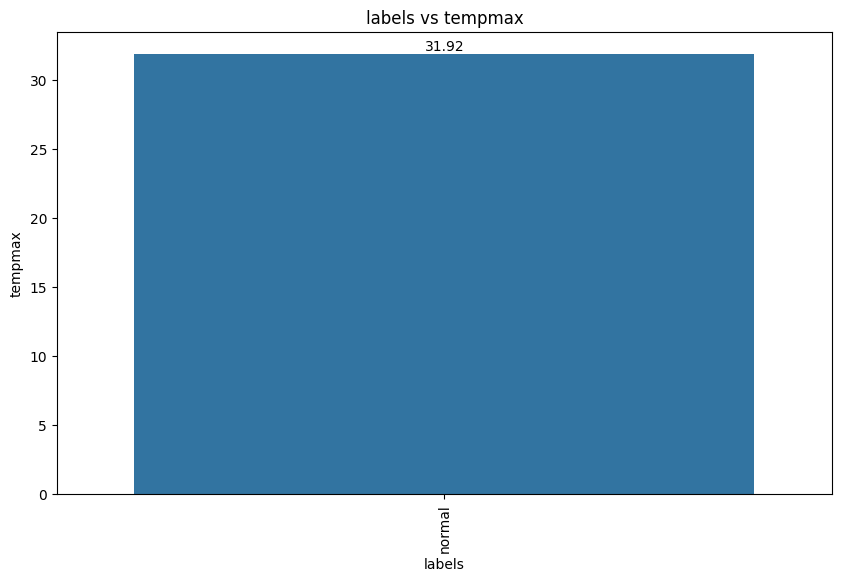

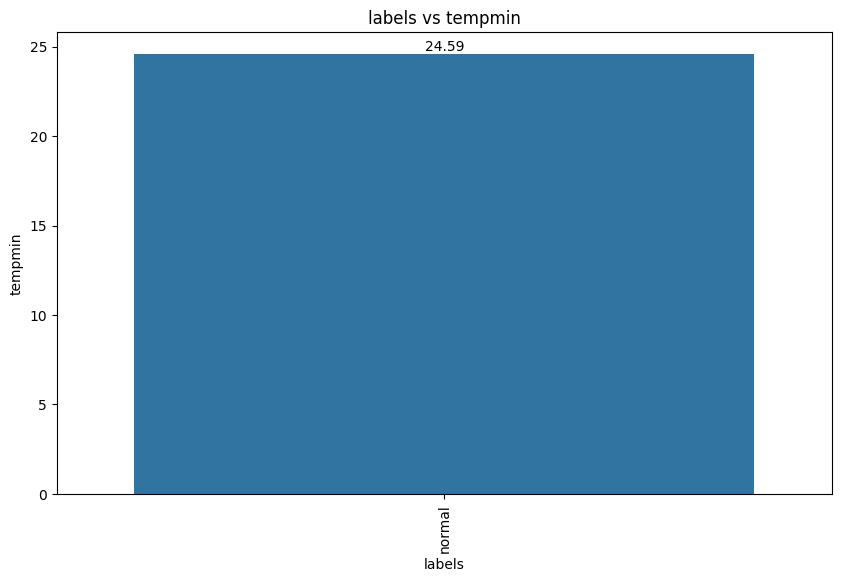

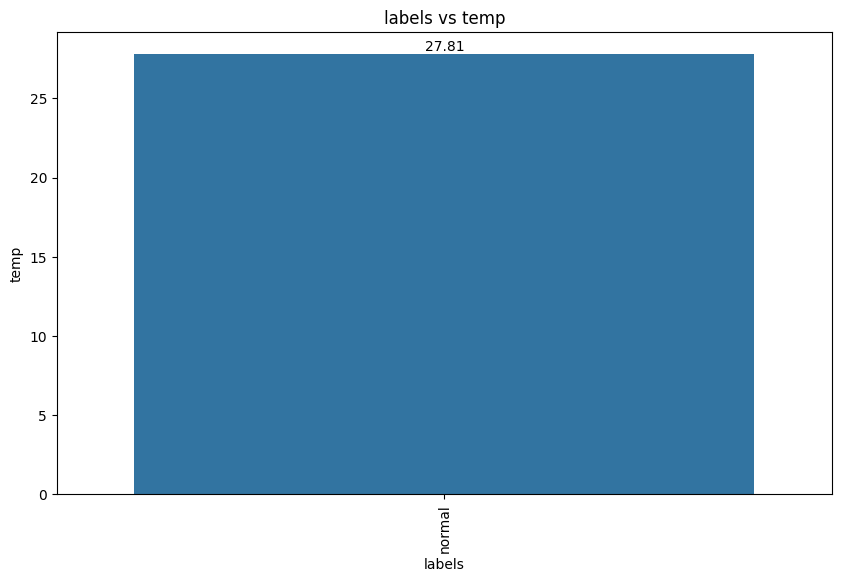

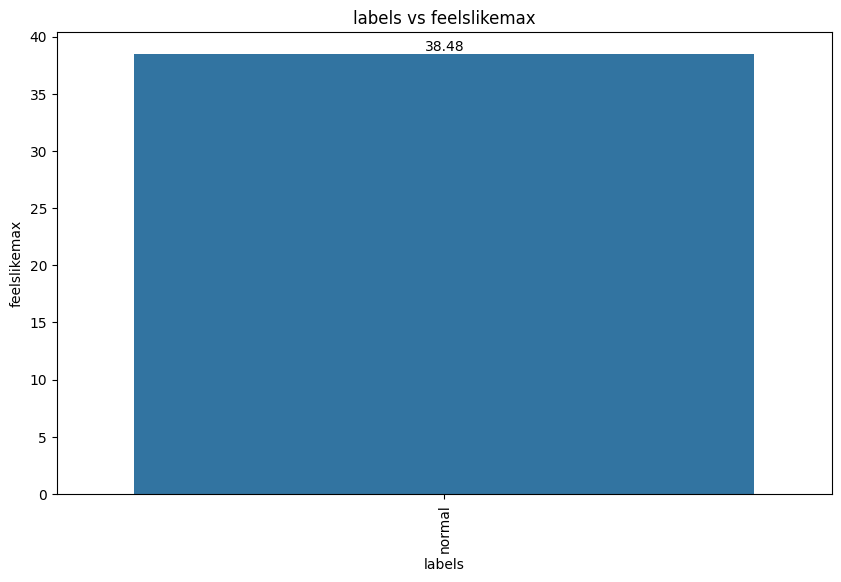

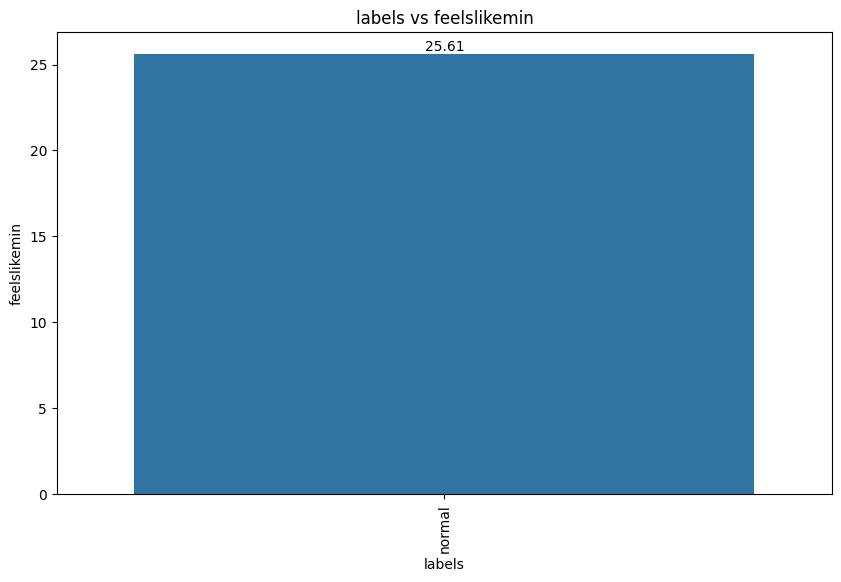

...

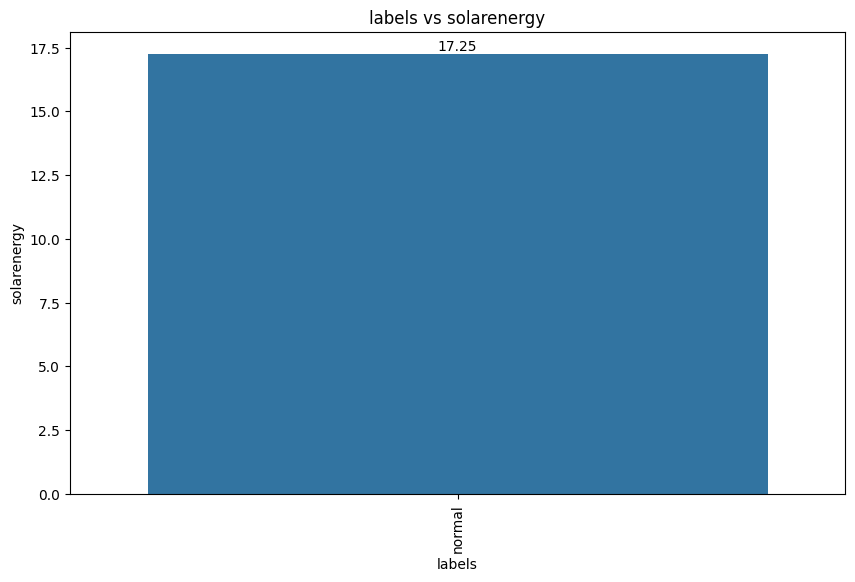

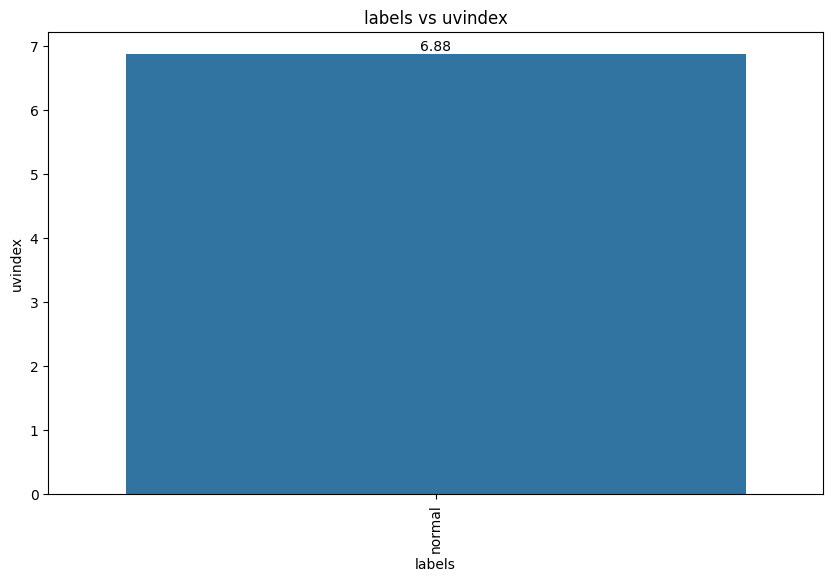

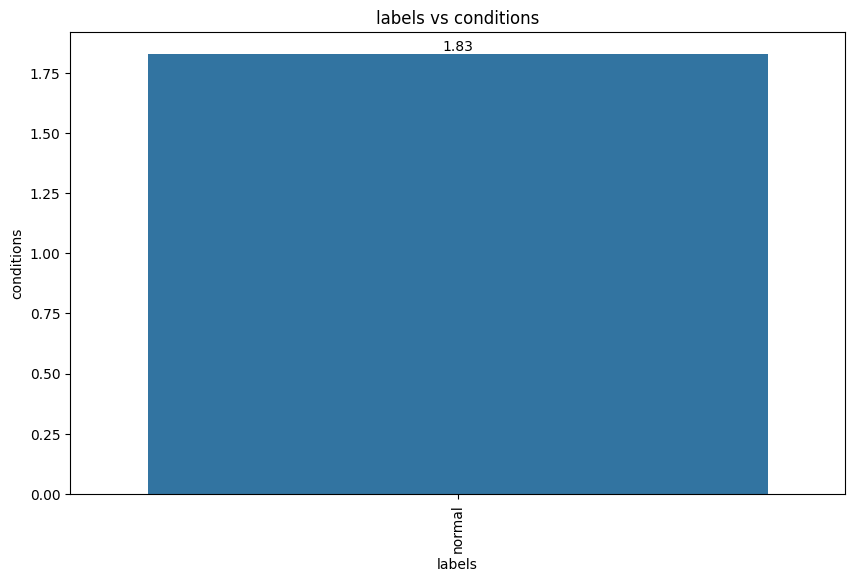

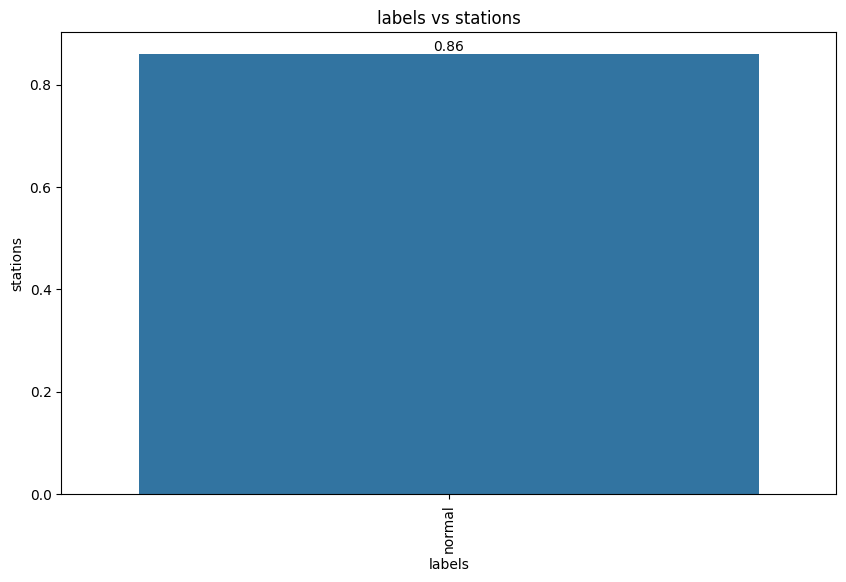

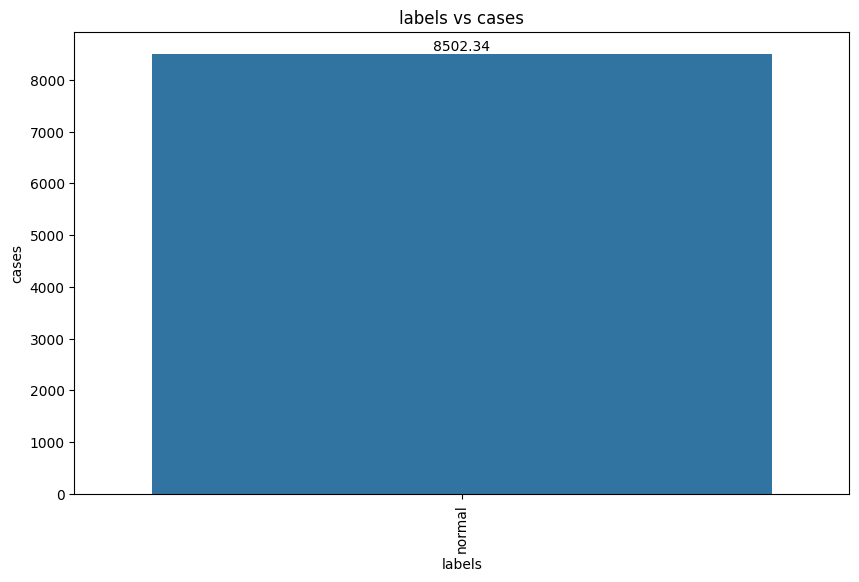

In [28]:
for dis in categorical:
    for cont in continuous:
        plt.figure(figsize=(10, 6))
        ax = sns.barplot(data=df, x=dis, y=cont, ci=None)
        plt.title(f'{dis} vs {cont}')
        
        for p in ax.patches:
            height = p.get_height()
            ax.annotate(f'{height:.2f}', (p.get_x() + p.get_width() / 2., height),
                        ha='center', va='bottom', fontsize=10, color='black', rotation=0)
        plt.xticks(rotation = 90)
        plt.show()

In [29]:
pivot_temp = pd.pivot_table(df, 
                            index=categorical, 
                            values=['tempmax', 'tempmin', 'temp', 'feelslikemax', 'feelslikemin', 'feelslike'], 
                            aggfunc='mean')

print("Temperature-related Pivot Table:")
print(pivot_temp)

Temperature-related Pivot Table:
        feelslike  feelslikemax  feelslikemin       temp    tempmax    tempmin
labels                                                                        
normal  31.485111     38.476069     25.613154  27.813181  31.918079  24.588318


In [30]:
pivot_precip_snow = pd.pivot_table(df, 
                                   index=categorical, 
                                   values=['snow', 'snowdepth', 'precip', 'precipprob', 'precipcover'], 
                                   aggfunc={'snow': 'sum', 'snowdepth': 'sum', 'precip': 'sum', 'precipprob': 'mean', 'precipcover': 'mean'})

print("Precipitation and Snow-related Pivot Table:")
print(pivot_precip_snow)

Precipitation and Snow-related Pivot Table:
             precip  precipcover  precipprob  snow  snowdepth
labels                                                       
normal  7898.759124     9.034032   69.625588     0          0


In [31]:
pivot_wind = pd.pivot_table(df, 
                            index=categorical, 
                            values=['windspeed', 'winddir'], 
                            aggfunc='mean')

print("Wind-related Pivot Table:")
print(pivot_wind)

Wind-related Pivot Table:
           winddir  windspeed
labels                       
normal  191.498693  17.599554


In [32]:
pivot_atmosphere = pd.pivot_table(df, 
                                  index=categorical, 
                                  values=['humidity', 'dew', 'sealevelpressure', 'cloudcover', 'visibility'], 
                                  aggfunc='mean')

print("Atmospheric and Visibility-related Pivot Table:")
print(pivot_atmosphere)

Atmospheric and Visibility-related Pivot Table:
        cloudcover        dew   humidity  sealevelpressure  visibility
labels                                                                
normal   59.701192  23.984349  81.254786       1004.690531     3.63262


In [33]:
pivot_solar = pd.pivot_table(df, 
                             index=categorical, 
                             values=['solarradiation', 'solarenergy', 'uvindex'], 
                             aggfunc='mean')

print("Solar and UV-related Pivot Table:")
print(pivot_solar)

Solar and UV-related Pivot Table:
        solarenergy  solarradiation   uvindex
labels                                       
normal    17.251785      199.802695  6.877674


In [34]:
pivot_cases_stations = pd.pivot_table(df, 
                                      index=categorical, 
                                      values=['cases', 'stations'], 
                                      aggfunc={'cases': 'sum', 'stations': 'count'})

print("Cases and Stations Pivot Table:")
print(pivot_cases_stations)

Cases and Stations Pivot Table:
          cases  stations
labels                   
normal  5118410       602


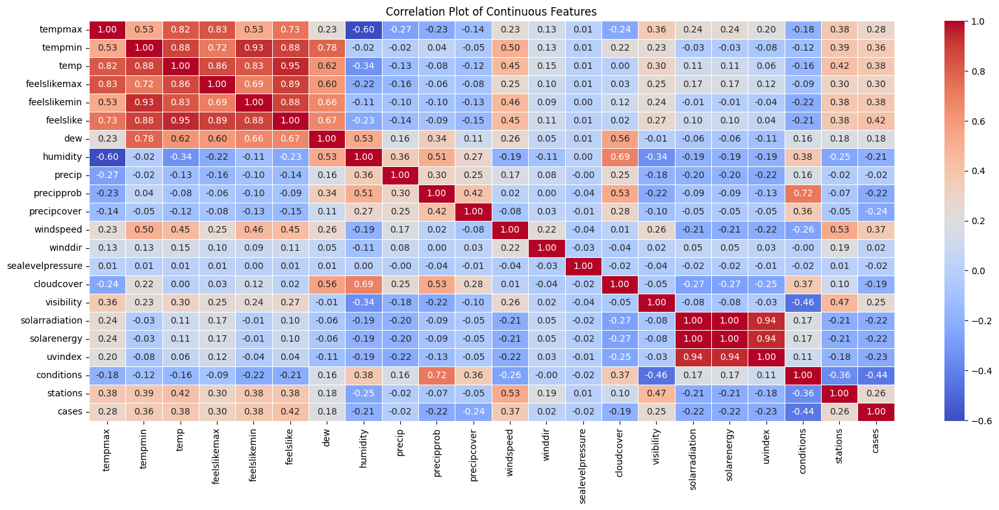

In [35]:
corr_matrix = df[continuous].corr()

plt.figure(figsize=(20, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Plot of Continuous Features')
plt.show()

In [36]:
corr_matrix

,tempmax,tempmin,temp,feelslikemax,feelslikemin,feelslike,dew,humidity,precip,precipprob,...,winddir,sealevelpressure,cloudcover,visibility,solarradiation,solarenergy,uvindex,conditions,stations,cases
tempmax,1.000000,0.527246,0.820941,0.832811,0.526838,0.732782,0.228436,-0.602729,-0.270202,-0.226290,...,0.131311,0.011288,-0.237572,0.358248,0.239410,0.239365,0.198627,-0.184010,0.381730,0.284181
tempmin,0.527246,1.000000,0.881988,0.716619,0.931412,0.883030,0.784664,-0.022102,-0.015915,0.043788,...,0.130978,0.007517,0.223664,0.225410,-0.034087,-0.034765,-0.075002,-0.115677,0.388823,0.364691
temp,0.820941,0.881988,1.000000,0.863626,0.829122,0.949866,0.621103,-0.335037,-0.130827,-0.077521,...,0.151874,0.011662,0.002212,0.299479,0.114995,0.114794,0.056545,-0.157189,0.421828,0.378149
feelslikemax,0.832811,0.716619,0.863626,1.000000,0.693604,0.891305,0.596466,-0.219550,-0.155520,-0.061133,...,0.096730,0.011925,0.034238,0.245154,0.167350,0.167075,0.115035,-0.094710,0.295325,0.304087
feelslikemin,0.526838,0.931412,0.829122,0.693604,1.000000,0.883670,0.664503,-0.112346,-0.099895,-0.097888,...,0.087622,0.002738,0.115816,0.235159,-0.007501,-0.008587,-0.038326,-0.218707,0.382937,0.376015
feelslike,0.732782,0.883030,0.949866,0.891305,0.883670,1.000000,0.671107,-0.231987,-0.138739,-0.093543,...,0.114765,0.005758,0.021153,0.273086,0.096916,0.096444,0.042182,-0.209585,0.376258,0.415344
dew,0.228436,0.784664,0.621103,0.596466,0.664503,0.671107,1.000000,0.525232,0.155076,0.337453,...,0.053704,0.010999,0.557726,-0.012443,-0.060513,-0.060210,-0.109187,0.159187,0.175522,0.179926
humidity,-0.602729,-0.022102,-0.335037,-0.219550,-0.112346,-0.231987,0.525232,1.000000,0.356233,0.509203,...,-0.107605,0.000054,0.687903,-0.343741,-0.193474,-0.192809,-0.193512,0.380631,-0.246563,-0.208195
precip,-0.270202,-0.015915,-0.130827,-0.155520,-0.099895,-0.138739,0.155076,0.356233,1.000000,0.303664,...,0.082522,-0.004838,0.253131,-0.184097,-0.195445,-0.195339,-0.223844,0.164735,-0.022313,-0.015551
precipprob,-0.226290,0.043788,-0.077521,-0.061133,-0.097888,-0.093543,0.337453,0.509203,0.303664,1.000000,...,0.002863,-0.044212,0.525631,-0.223092,-0.092390,-0.091298,-0.133590,0.718616,-0.070126,-0.222055


In [37]:
threshold = 0.65
features_to_drop = []
for i in range(len(corr_matrix.columns)):
    for j in range(i):
        if abs(corr_matrix.iloc[i, j]) > threshold:
            colname = corr_matrix.columns[i]
            if colname not in features_to_drop:
                features_to_drop.append(colname)

In [38]:
features_to_drop

['temp',
 'feelslikemax',
 'feelslikemin',
 'feelslike',
 'dew',
 'cloudcover',
 'solarenergy',
 'uvindex',
 'conditions']

In [39]:
df = df.drop(['temp',
 'feelslikemax',
 'feelslikemin',
 'feelslike',
 'dew',
 'solarenergy',
 'uvindex',
 'conditions'], axis = 1)

In [40]:
df = pd.get_dummies(df, columns=['labels']) 

In [41]:
df

,tempmax,tempmin,humidity,precip,precipprob,precipcover,snow,snowdepth,windspeed,winddir,sealevelpressure,cloudcover,visibility,solarradiation,stations,cases,labels_normal
0,34.053151,24.478082,73.508219,2.921726,44.657534,4.360932,0,0,15.678356,175.595342,1007.911781,50.747945,3.789863,208.097808,1.197260,4925,True
1,34.086179,25.694309,72.066667,3.783415,39.837398,2.676748,0,0,14.574797,158.349593,1003.533333,48.313821,2.884553,222.926016,0.991870,5077,True
2,34.573984,25.417886,69.424390,3.065854,33.333333,2.337805,0,0,14.978049,202.621138,1005.731707,55.621138,4.242276,229.413008,1.170732,7579,True
3,33.020325,25.080488,69.297561,6.025203,37.398374,2.676667,0,0,16.504878,183.544715,1003.359350,50.208130,2.991057,225.421951,0.146341,13706,True
4,30.660976,24.230894,86.652033,23.336585,96.747967,15.616992,0,0,19.546341,224.030081,1009.995935,45.542276,3.886992,176.598374,3.951220,82,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
597,32.300000,24.400000,75.000000,0.000000,0.000000,0.000000,0,0,17.100000,159.800000,1008.900000,50.400000,3.100000,252.500000,1.000000,6729,True
598,32.700000,26.400000,68.500000,0.000000,0.000000,0.000000,0,0,16.600000,233.000000,1010.400000,50.500000,3.100000,242.700000,1.000000,10541,True
599,33.000000,26.300000,71.100000,0.000000,0.000000,0.000000,0,0,19.000000,344.400000,1010.800000,30.500000,3.100000,195.300000,1.000000,6396,True
600,35.100000,26.800000,65.900000,0.000000,0.000000,0.000000,0,0,14.700000,81.300000,1009.700000,32.700000,3.300000,187.600000,1.000000,10883,True


In [42]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

In [43]:
categorical, non_categorical, discrete, continuous = classify_features(df)

In [44]:
scaler = StandardScaler()
df[continuous] = scaler.fit_transform(df[continuous])

In [45]:
X = df.drop(columns=['cases'])
y = df['cases']

In [46]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [47]:
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

svm_model = SVR()
svm_model.fit(X_train, y_train)

SVR()

In [48]:
y_pred_svm = svm_model.predict(X_test)
mse_svm = mean_squared_error(y_test, y_pred_svm)
print(f'SVM Mean Squared Error: {mse_svm}')

SVM Mean Squared Error: 0.5295336245622033


In [49]:
rmse_svm = mse_svm ** 0.5

In [50]:
print(f'SVM Root Mean Squared Error: {rmse_svm}')

SVM Root Mean Squared Error: 0.727690610467253


In [51]:
mae = mean_absolute_error(y_test, y_pred_svm)
r2 = r2_score(y_test, y_pred_svm)
print(f"MAE: {mae}")
print(f"R²: {r2}")

MAE: 0.5515013745359914
R²: 0.4151010754504304


In [52]:
from sklearn.tree import DecisionTreeRegressor

dtr_model = DecisionTreeRegressor()
dtr_model.fit(X_train, y_train)

DecisionTreeRegressor()

In [53]:
y_pred_dtr = dtr_model.predict(X_test)
mse_dtr = mean_squared_error(y_test, y_pred_dtr)
print(f'Decision Tree Regressor Mean Squared Error: {mse_dtr}')

Decision Tree Regressor Mean Squared Error: 1.1869500205087606


In [54]:
rmse_dtr = mse_dtr ** 0.5

In [55]:
print(f'DT Root Mean Squared Error: {rmse_dtr}')

DT Root Mean Squared Error: 1.0894723587630668


In [56]:
mae = mean_absolute_error(y_test, y_pred_dtr)
r2 = r2_score(y_test, y_pred_dtr)
print(f"MAE: {mae}")
print(f"R²: {r2}")

MAE: 0.7577035365938664
R²: -0.3110513823624279


In [57]:
from sklearn.ensemble import RandomForestRegressor

rfr_model = RandomForestRegressor()
rfr_model.fit(X_train, y_train)

RandomForestRegressor()

In [58]:
y_pred_rfr = rfr_model.predict(X_test)
mse_rfr = mean_squared_error(y_test, y_pred_rfr)
print(f'Random Forest Regressor Mean Squared Error: {mse_rfr}')

Random Forest Regressor Mean Squared Error: 0.5189574890704751


In [59]:
rmse_rfr = mse_rfr ** 0.5

In [60]:
print(f'RF Root Mean Squared Error: {rmse_rfr}')

RF Root Mean Squared Error: 0.7203870411594555


In [61]:
mae = mean_absolute_error(y_test, y_pred_rfr)
r2 = r2_score(y_test, y_pred_rfr)
print(f"MAE: {mae}")
print(f"R²: {r2}")

MAE: 0.551356773355188
R²: 0.4267829970283409


In [62]:
import xgboost as xgb
from xgboost import XGBRegressor

xgboost_model = XGBRegressor()
xgboost_model.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [63]:
y_pred_xgb = xgboost_model.predict(X_test)
mse_xgb = mean_squared_error(y_test, y_pred_xgb)
print(f'XGBoost Regressor Mean Squared Error: {mse_xgb}')

XGBoost Regressor Mean Squared Error: 0.6388940809544029


In [64]:
rmse_xgb = mse_xgb ** 0.5

In [65]:
print(f'XGB Root Mean Squared Error: {rmse_xgb}')

XGB Root Mean Squared Error: 0.7993085017403498


In [66]:
mae = mean_absolute_error(y_test, y_pred_xgb)
r2 = r2_score(y_test, y_pred_xgb)
print(f"MAE: {mae}")
print(f"R²: {r2}")

MAE: 0.5929500964400951
R²: 0.29430645474068584


In [67]:
from keras.models import Sequential
from keras.layers import Dense

In [68]:
X_train.columns

Index(['tempmax', 'tempmin', 'humidity', 'precip', 'precipprob', 'precipcover',
       'snow', 'snowdepth', 'windspeed', 'winddir', 'sealevelpressure',
       'cloudcover', 'visibility', 'solarradiation', 'stations',
       'labels_normal'],
      dtype='object')

In [69]:
X_train['labels_normal'] = X_train['labels_normal'].astype(int)

In [70]:
X_test['labels_normal'] = X_test['labels_normal'].astype(int)

In [71]:
ann_model = Sequential()
ann_model.add(Dense(512, activation='relu', input_shape=(X_train.shape[1],)))
ann_model.add(Dense(256, activation='relu'))
ann_model.add(Dense(128, activation='relu'))
ann_model.add(Dense(64, activation='relu'))
ann_model.add(Dense(32, activation='relu'))
ann_model.add(Dense(1, activation='linear'))

In [72]:
ann_model.compile(loss='mse', optimizer='adam', metrics=['mse'])
ann_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 512)               8704      
                                                                 
 dense_1 (Dense)             (None, 256)               131328    
                                                                 
 dense_2 (Dense)             (None, 128)               32896     
                                                                 
 dense_3 (Dense)             (None, 64)                8256      
                                                                 
 dense_4 (Dense)             (None, 32)                2080      
                                                                 
 dense_5 (Dense)             (None, 1)                 33        
                                                                 
Total params: 183297 (716.00 KB)
Trainable params: 18329

In [73]:
history = ann_model.fit(X_train, y_train, epochs=20, batch_size=32, validation_split=0.2, verbose=1)

Epoch 1/20
12/12 [==============================] - 3s 47ms/step - loss: 0.7956 - mse: 0.7956 - val_loss: 0.6829 - val_mse: 0.6829
Epoch 2/20
12/12 [==============================] - 0s 19ms/step - loss: 0.5922 - mse: 0.5922 - val_loss: 0.6281 - val_mse: 0.6281
Epoch 3/20
12/12 [==============================] - 0s 20ms/step - loss: 0.5191 - mse: 0.5191 - val_loss: 0.6412 - val_mse: 0.6412
Epoch 4/20
12/12 [==============================] - 0s 23ms/step - loss: 0.4482 - mse: 0.4482 - val_loss: 0.6043 - val_mse: 0.6043
Epoch 5/20
12/12 [==============================] - 0s 19ms/step - loss: 0.4218 - mse: 0.4218 - val_loss: 0.6867 - val_mse: 0.6867
Epoch 6/20
12/12 [==============================] - 0s 18ms/step - loss: 0.3799 - mse: 0.3799 - val_loss: 0.6536 - val_mse: 0.6536
Epoch 7/20
12/12 [==============================] - 0s 21ms/step - loss: 0.3564 - mse: 0.3564 - val_loss: 0.6718 - val_mse: 0.6718
Epoch 8/20
12/12 [==============================] - 0s 24ms/step - loss: 0.3332 - m

In [74]:
y_pred = ann_model.predict(X_test)

4/4 [==============================] - 0s 3ms/step


In [75]:
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'DL Mean Squared Error: {mse}')
print(f'DL R^2 Score: {r2}')

DL Mean Squared Error: 0.5969762522333337
DL R^2 Score: 0.34060699506742464


In [76]:
from sklearn.linear_model import LinearRegression

In [77]:
df[continuous] = df[continuous].apply(lambda x: x + (1 - x.min()) if x.min() <= 0 else x)

In [78]:
df[continuous] = np.log(df[continuous])

In [79]:
X = df.drop(columns=['cases'])
y = df['cases']

In [80]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [81]:
linear_model = LinearRegression()
linear_model.fit(X_train, y_train)

LinearRegression()

In [82]:
y_pred = linear_model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Linear Regression Mean Squared Error: {mse}')
print(f'Linear Regression R^2 Score: {r2}')

Linear Regression Mean Squared Error: 0.13564140049830034
Linear Regression R^2 Score: 0.31351397740834075


# Thanks !!!